# TP — Auto-encodeur & détection d'anomalies (catégorie `wood`)

## Objectif concret

Ce notebook réalise, de bout en bout, le TP décrit dans
[`docs/02-sprint-2/05-consignes/b6_deep_learning_auto_encodeur.md`](../../../docs/02-sprint-2/05-consignes/b6_deep_learning_auto_encodeur.md)
(B6 partie 2 — partie modèle) : concevoir un auto-encodeur convolutif, l'entraîner sur les seules
pièces saines, calibrer un seuil de détection d'anomalie, produire des **heatmaps de reconstruction**
comparées aux masques de vérité terrain, puis évaluer quantitativement (AUROC image et pixel). La
section finale traite dès à présent deux pistes de la partie **« Pour aller plus loin »** de la
consigne : resserrer le goulot d'étranglement, et essayer la perte **SSIM**.

Ce notebook réutilise sans les ré-expliquer les notions de
[B6 partie 1 — préparation des données](../../../docs/02-sprint-2/05-consignes/b6_deep_learning_donnees.md)
(chargement, normalisation, split, augmentation) déjà mises en œuvre dans
[`01-preparation-donnees-augmentation-wood.ipynb`](01-preparation-donnees-augmentation-wood.ipynb), ainsi
que l'architecture d'auto-encodeur et les fonctions de scoring déjà utilisées dans
[`02c-autoencoder-pytorch-gpu.ipynb`](02c-autoencoder-pytorch-gpu.ipynb) (module
`indusense.vision.autoencoder_torch`) et
[`02d`](02d-comparaison-frameworks-devices.ipynb)/[`02e`](02e-autoencoder-pytorch-gpu-seuils.ipynb)
(module `indusense.vision.anomaly`).

## Prérequis

- **Noyau Jupyter** : sélectionner **`Python 3.12 (indusense, PyTorch ROCm)`** (`indusense-py312-rocm`),
  pas le noyau `python3` par défaut.
- Ouvrir depuis la racine du projet `indusense`.
- Un GPU AMD compatible ROCm 7.2.1 doit être détecté (`torch.cuda.is_available()`).
- Les données `wood` doivent être préparées (voir prérequis de `01-preparation-donnees-augmentation-wood.ipynb`).

## Pourquoi PyTorch (et pas Keras/TensorFlow comme suggéré par la consigne) ?

La consigne mentionne Keras/TensorFlow pour l'étape 1. Ce projet a déjà documenté
(voir [`02a-autoencoder-tensorflow-cpu.ipynb`](02a-autoencoder-tensorflow-cpu.ipynb) et la fiche de
révision correspondante) que **TensorFlow n'a pas de support GPU natif sous Windows** (≥ 2.11). Comme la
consigne de cette session demande un entraînement **directement sur GPU**, ce notebook utilise PyTorch +
ROCm (déjà utilisé et validé dans `02c`), qui couvre exactement les mêmes exigences pédagogiques
(convolution/déconvolution, `Adam`, MSE, suivi MLflow) sans le blocage matériel de TensorFlow sur cette
machine. L'équivalent PyTorch de `model.summary()` (Keras) est `print(model)` (liste des couches) combiné
à un compte manuel des paramètres entraînables — utilisé ci-dessous.

In [1]:
from pathlib import Path
import time

import matplotlib.pyplot as plt
import numpy as np
import torch

PROJECT_ROOT = Path.cwd()
assert (PROJECT_ROOT / 'pyproject.toml').exists(), (
    'Ouvrir le notebook depuis la racine du projet indusense.'
)

DEVICE = "cuda"
assert torch.cuda.is_available(), "GPU ROCm non détecté par PyTorch."
device = torch.device(DEVICE)
print(f'PyTorch {torch.__version__}, device={device} ({torch.cuda.get_device_name(0)})')

from indusense.vision.dataset import (
    list_defect_categories, list_image_paths, list_mask_paths, load_image_batch, load_mask_batch,
    resolve_category_root, split_train_validation,
)
from indusense.vision.augment import augment_batch, build_augmentation_pipeline
from indusense.vision.autoencoder_torch import (
    ConvAutoencoder, count_trainable_parameters, evaluate_loss, images_to_tensor, ssim_loss,
    tensor_to_images,
)
from indusense.vision.anomaly import (
    choose_threshold_percentile, evaluate_at_threshold, pixel_level_roc_auc, ranking_metrics,
    reconstruction_error, reconstruction_heatmap,
)

CATEGORY = 'wood'
IMAGE_SIZE = 256
BASE_CHANNELS = 64
KERNEL_SIZE = 3
BATCH_SIZE = 32
EPOCHS = 60
VALIDATION_FRACTION = 0.15
THRESHOLD_PERCENTILE = 99.0
SEED = 42

category_root = resolve_category_root(CATEGORY)
defect_categories = list_defect_categories(category_root)
train_good_paths = list_image_paths(category_root, 'train', 'good')
split = split_train_validation(train_good_paths, validation_fraction=VALIDATION_FRACTION, seed=SEED)

test_good_paths = list_image_paths(category_root, 'test', 'good')
test_defect_paths = {d: list_image_paths(category_root, 'test', d) for d in defect_categories}
test_mask_paths = {d: list_mask_paths(category_root, d) for d in defect_categories}

print(f'Train (saines, augmentées à chaque époque) : {len(split.train_paths)}')
print(f'Validation (saines, calibration du seuil) : {len(split.validation_paths)}')
print(f'Test sain : {len(test_good_paths)} ; test défauts : {sum(len(p) for p in test_defect_paths.values())}')

PyTorch 2.9.1+rocm7.2.1, device=cuda (AMD Radeon RX 9070 XT)


D:\source\A4U\FormationIA\indusense\.venv-py312-rocm\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Train (saines, augmentées à chaque époque) : 210
Validation (saines, calibration du seuil) : 37
Test sain : 19 ; test défauts : 60


## Charger les images, les masques de vérité terrain, et construire le pipeline d'augmentation

Les images sont chargées une seule fois en mémoire (train, validation, test sain, test défauts) ; le
**masque de vérité terrain** de chaque image de défaut est chargé en parallèle (même numérotation de
fichier que l'image, voir `indusense.vision.dataset.list_mask_paths`) — il servira uniquement en étape 4
à évaluer la **localisation** du défaut, jamais à l'entraînement. Les images saines de test n'ont pas de
masque associé (aucun défaut à localiser) : un masque entièrement à zéro est utilisé.

In [2]:
train_raw_images = load_image_batch(split.train_paths, IMAGE_SIZE)
validation_images = load_image_batch(split.validation_paths, IMAGE_SIZE)
test_good_images = load_image_batch(test_good_paths, IMAGE_SIZE)
test_defect_images = {d: load_image_batch(paths, IMAGE_SIZE) for d, paths in test_defect_paths.items()}
test_defect_masks = {d: load_mask_batch(paths, IMAGE_SIZE) for d, paths in test_mask_paths.items()}

test_images_by_group = {'good': test_good_images, **test_defect_images}
test_masks_by_group = {
    'good': np.zeros((len(test_good_images), IMAGE_SIZE, IMAGE_SIZE), dtype=np.float32),
    **test_defect_masks,
}

augmentation_pipeline = build_augmentation_pipeline(seed=SEED)

for group, images in test_images_by_group.items():
    print(f'test[{group}] images={images.shape} masques={test_masks_by_group[group].shape}')

test[good] images=(19, 256, 256, 3) masques=(19, 256, 256)
test[color] images=(8, 256, 256, 3) masques=(8, 256, 256)
test[combined] images=(11, 256, 256, 3) masques=(11, 256, 256)
test[hole] images=(10, 256, 256, 3) masques=(10, 256, 256)
test[liquid] images=(10, 256, 256, 3) masques=(10, 256, 256)
test[scratch] images=(21, 256, 256, 3) masques=(21, 256, 256)


## Étape 1 — Concevoir l'auto-encodeur

Architecture demandée par la consigne : **3 couches de convolution** (encodeur) + **3 couches de
déconvolution** (décodeur), sortie `sigmoid`. C'est exactement l'architecture de
`indusense.vision.autoencoder_torch.ConvAutoencoder`, déjà utilisée et validée dans `02c` :

| Bloc | Couches | Canaux |
|---|---|---|
| Encodeur | `Conv 3×3, stride 2` ×3 (+ ReLU) | `3 → 64 → 128 → 256` |
| **Goulot d'étranglement** | — | `32×32×256` |
| Décodeur | `ConvTranspose 3×3, stride 2` ×3 (+ ReLU, puis Sigmoid en sortie) | `256 → 128 → 64 → 3` |

La sortie `Sigmoid` produit des valeurs dans `[0, 1]`, cohérentes avec la normalisation `[0, 1]` des
images (voir partie 1).

In [3]:
torch.manual_seed(SEED)
baseline_model = ConvAutoencoder(base_channels=BASE_CHANNELS, kernel_size=KERNEL_SIZE).to(device)
baseline_parameters = count_trainable_parameters(baseline_model)

print(baseline_model)
print(f'\nParamètres entraînables : {baseline_parameters:,}'.replace(',', ' '))

bottleneck_spatial = IMAGE_SIZE // (2 ** 3)
bottleneck_channels = BASE_CHANNELS * 4
input_values = IMAGE_SIZE * IMAGE_SIZE * 3
latent_values = bottleneck_spatial * bottleneck_spatial * bottleneck_channels
compression_ratio = input_values / latent_values

print(f'\nGoulot d\'étranglement : {bottleneck_spatial}×{bottleneck_spatial}×{bottleneck_channels} = {latent_values:,} valeurs'.replace(',', ' '))
print(f'Entrée : {IMAGE_SIZE}×{IMAGE_SIZE}×3 = {input_values:,} valeurs'.replace(',', ' '))
print(f'Ratio de compression (entrée ÷ latent) : {compression_ratio:.3f}')

ConvAutoencoder(
  (encoder): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(128, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (5): ReLU(inplace=True)
  )
  (decoder): Sequential(
    (0): ConvTranspose2d(256, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), output_padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): ConvTranspose2d(128, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), output_padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): ConvTranspose2d(64, 3, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), output_padding=(1, 1))
    (5): Sigmoid()
  )
)

Paramètres entraînables : 741 379

Goulot d'étranglement : 32×32×256 = 262 144 valeurs
Entrée : 256×256×3 = 196 608 valeurs
Ratio de compression (entrée ÷ latent) : 0.750


## Lecture du résultat précédent : le modèle est-il conforme, et le ratio de compression est-il sain ?

Le modèle compte **741 379** paramètres entraînables — trois convolutions puis trois déconvolutions,
sortie `Sigmoid`, conforme à l'architecture demandée (déjà validée dans `02c` et comparée à une version
Keras strictement équivalente dans `02a`/`02d`, même compte de paramètres).

**Le point de réflexion clé de la consigne, calculé ci-dessus, est préoccupant.** Le goulot
d'étranglement contient `32×32×256` = **262 144** valeurs, contre **196 608** valeurs en entrée
(`256×256×3`) : le ratio de compression (entrée ÷ latent) vaut **0,75** — **inférieur à 1**. Autrement
dit, ce n'est **pas un goulot d'étranglement au sens strict** : l'espace latent contient *plus* de
valeurs que l'image d'origine (le nombre de canaux, ×256, augmente plus vite que la résolution spatiale
ne diminue, ×64). La consigne prévient : un ratio proche de 1 (et ici, en dessous de 1) autorise le
modèle à apprendre une **quasi-identité** — reconstruire fidèlement à peu près n'importe quelle image,
défauts compris — ce qui **détruit le signal d'anomalie**. C'est précisément ce que la section
« Pour aller plus loin » teste plus bas en resserrant réellement ce goulot (`BASE_CHANNELS` réduit).

## Étape 2 — Entraîner

Entraînement avec cible = entrée (reconstruction), optimiseur `Adam`, perte **MSE** — la perte demandée
par défaut par la consigne. La perte **SSIM** (suggérée en alternative, « plus sensible aux altérations de
texture ») est testée séparément dans la section « Pour aller plus loin », en comparaison directe avec ce
modèle de référence, à architecture strictement identique.

Le suivi est fait dans **MLflow** (store local SQLite du projet, `.mlflow/`, déjà utilisé dans les TP de
maintenance prédictive du sprint 2) : paramètres, perte d'entraînement **et de validation** par époque,
métriques finales, et la courbe d'apprentissage en artefact.

In [4]:
import mlflow

MLFLOW_STORE = PROJECT_ROOT / '.mlflow'
MLFLOW_ARTIFACTS = MLFLOW_STORE / 'artifacts'
MLFLOW_EXPERIMENT = 'indusense-autoencodeur-anomalies'

mlflow.set_tracking_uri('sqlite:///' + (MLFLOW_STORE / 'mlflow.db').as_posix())
if mlflow.get_experiment_by_name(MLFLOW_EXPERIMENT) is None:
    mlflow.create_experiment(MLFLOW_EXPERIMENT, artifact_location=MLFLOW_ARTIFACTS.as_uri())
mlflow.set_experiment(MLFLOW_EXPERIMENT)
print(f'Suivi MLflow : experiment="{MLFLOW_EXPERIMENT}", store={MLFLOW_STORE}')

2026/09/22 11:25:53 INFO mlflow.agent.hint: Load the `instrumenting-with-mlflow-tracing` skill at D:\source\A4U\FormationIA\indusense\.venv-py312-rocm\Lib\site-packages\mlflow\assistant\skills\instrumenting-with-mlflow-tracing\SKILL.md before writing any tracing code; it ships with this MLflow install. Set MLFLOW_DISABLE_AGENT_HINT=1 to silence this.


Suivi MLflow : experiment="indusense-autoencodeur-anomalies", store=D:\source\A4U\FormationIA\indusense\.mlflow


### Fonctions d'entraînement et d'évaluation (réutilisées pour les 3 modèles de ce notebook)

Le modèle de référence ci-dessus et les deux variantes de la section « Pour aller plus loin » (goulot
resserré, perte SSIM) partagent exactement la même boucle d'entraînement et la même procédure
d'évaluation : seuls l'architecture (`base_channels`) ou la perte (`loss_fn`) changent d'un appel à
l'autre. Facteur toute logique commune ici évite de dupliquer trois fois le même code.

In [5]:
def run_epoch(raw_images, model, optimizer, loss_fn, pipeline, device, batch_size):
    augmented = np.clip(augment_batch(raw_images, pipeline), 0.0, 1.0)
    batch = images_to_tensor(augmented).to(device)
    permutation = torch.randperm(batch.shape[0])
    running_loss = 0.0
    model.train()
    for start in range(0, batch.shape[0], batch_size):
        indices = permutation[start:start + batch_size]
        images = batch[indices]
        optimizer.zero_grad()
        reconstruction = model(images)
        loss = loss_fn(reconstruction, images)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * images.shape[0]
    return running_loss / batch.shape[0]


def train_autoencoder(model, loss_fn, run_name, params, epochs=EPOCHS,
                       train_images=None, val_images=None, pipeline=None):
    """`train_images`/`val_images`/`pipeline` par défaut = ceux de `wood` (globals) ; passer les
    siens pour entraîner sur une autre catégorie (ex. `metal_nut`, piste 3 ci-dessous)."""
    train_images = train_raw_images if train_images is None else train_images
    val_images = validation_images if val_images is None else val_images
    pipeline = augmentation_pipeline if pipeline is None else pipeline
    torch.manual_seed(SEED)
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
    train_history, val_history = [], []
    started = time.perf_counter()
    with mlflow.start_run(run_name=run_name) as run:
        mlflow.log_params(params)
        for epoch in range(epochs):
            train_loss = run_epoch(train_images, model, optimizer, loss_fn, pipeline, device, BATCH_SIZE)
            val_loss = evaluate_loss(val_images, model, loss_fn, device, BATCH_SIZE)
            train_history.append(train_loss)
            val_history.append(val_loss)
            mlflow.log_metric('train_loss', train_loss, step=epoch)
            mlflow.log_metric('val_loss', val_loss, step=epoch)
            if (epoch + 1) % 10 == 0 or epoch == epochs - 1:
                print(f'Époque {epoch + 1:>3}/{epochs} — train={train_loss:.5f}  val={val_loss:.5f}')
        train_seconds = time.perf_counter() - started
        mlflow.log_metric('train_seconds', train_seconds)
        run_id = run.info.run_id
    print(f'\nEntraînement terminé en {train_seconds:.1f} s (run MLflow {run_id})')
    return train_history, val_history, run_id


@torch.no_grad()
def reconstruct(images_hwc, model, device, batch_size=32):
    model.eval()
    tensor = images_to_tensor(images_hwc)
    outputs = []
    for start in range(0, tensor.shape[0], batch_size):
        batch = tensor[start:start + batch_size].to(device)
        outputs.append(tensor_to_images(model(batch)))
    return np.concatenate(outputs, axis=0)


def evaluate_model(
    model, images_by_group=None, masks_by_group=None, categories=None,
    threshold_percentile=THRESHOLD_PERCENTILE, val_images=None,
):
    """Généralisation : catégorie par défaut = `wood` (globals), ou catégorie explicite
    (ex. `metal_nut`) en passant ses propres dictionnaires d'images/masques et sa liste de défauts.
    """
    images_by_group = test_images_by_group if images_by_group is None else images_by_group
    masks_by_group = test_masks_by_group if masks_by_group is None else masks_by_group
    categories = defect_categories if categories is None else categories
    val_images = validation_images if val_images is None else val_images

    validation_reconstruction = reconstruct(val_images, model, device)
    validation_errors = reconstruction_error(val_images, validation_reconstruction)
    threshold = choose_threshold_percentile(validation_errors, percentile=threshold_percentile)

    test_errors_by_group, test_heatmaps_by_group = {}, {}
    for group_name, images in images_by_group.items():
        recon = reconstruct(images, model, device)
        test_errors_by_group[group_name] = reconstruction_error(images, recon)
        test_heatmaps_by_group[group_name] = reconstruction_heatmap(images, recon)

    test_labels = np.concatenate([
        np.zeros(len(test_errors_by_group['good']), dtype=int),
        *[np.ones(len(test_errors_by_group[d]), dtype=int) for d in categories],
    ])
    test_scores = np.concatenate(
        [test_errors_by_group['good']] + [test_errors_by_group[d] for d in categories]
    )
    ranking = ranking_metrics(test_labels, test_scores)
    threshold_metrics = evaluate_at_threshold(test_labels, test_scores, threshold)

    all_heatmaps = np.concatenate(
        [test_heatmaps_by_group['good']] + [test_heatmaps_by_group[d] for d in categories], axis=0
    )
    all_masks = np.concatenate(
        [masks_by_group['good']] + [masks_by_group[d] for d in categories], axis=0
    )
    pixel_roc_auc = pixel_level_roc_auc(all_masks, all_heatmaps)

    return {
        'threshold': threshold,
        'validation_errors': validation_errors,
        'test_errors_by_group': test_errors_by_group,
        'test_heatmaps_by_group': test_heatmaps_by_group,
        'test_labels': test_labels,
        'test_scores': test_scores,
        'roc_auc': ranking['roc_auc'],
        'pr_auc': ranking['pr_auc'],
        'pixel_roc_auc': pixel_roc_auc,
        'threshold_metrics': threshold_metrics,
    }


print('Fonctions définies : train_autoencoder, reconstruct, evaluate_model.')

Fonctions définies : train_autoencoder, reconstruct, evaluate_model.


### Entraîner le modèle de référence

Perte MSE, `BASE_CHANNELS=64`, `KERNEL_SIZE=3`, 60 époques, lot de 32 — mêmes hyperparamètres que
`02c-autoencoder-pytorch-gpu.ipynb`.

In [6]:
baseline_loss_fn = torch.nn.MSELoss()
baseline_train_history, baseline_val_history, baseline_run_id = train_autoencoder(
    baseline_model, baseline_loss_fn, run_name='baseline-mse-bc64',
    params={
        'image_size': IMAGE_SIZE, 'batch_size': BATCH_SIZE, 'epochs': EPOCHS,
        'base_channels': BASE_CHANNELS, 'kernel_size': KERNEL_SIZE, 'loss': 'mse',
        'trainable_parameters': baseline_parameters, 'compression_ratio': compression_ratio,
    },
)

Époque  10/60 — train=0.00392  val=0.00392


Époque  20/60 — train=0.00091  val=0.00121


Époque  30/60 — train=0.00064  val=0.00092


Époque  40/60 — train=0.00052  val=0.00071


Époque  50/60 — train=0.00036  val=0.00055


Époque  60/60 — train=0.00040  val=0.00071

Entraînement terminé en 50.7 s (run MLflow 4d71d1216ab84826bb08263dfcd95b8c)


## Lecture du résultat précédent : l'entraînement a-t-il convergé, sans sur-apprentissage ?

La perte MSE décroît rapidement sur les 10 premières époques (train : 0,0169 → 0,00392 ; validation : 0,0072 → 0,00392), avec un plateau/rebond commun aux deux courbes entre les époques 5 et 9 — déjà observé dans `02c`, un effet de l'augmentation aléatoire qui produit, sur quelques époques, un lot de train visuellement plus éloigné de la moyenne — puis une décroissance conjointe jusqu'à un plateau bas en fin d'entraînement (train ≈ 0,0003–0,0006, validation ≈ 0,0005–0,0008). Les deux courbes restent proches et évoluent ensemble sur les 60 époques (voir la figure ci-dessous) : rien n'indique de sur-apprentissage marqué — la perte de validation ne se met jamais à remonter durablement pendant que le train continue de baisser. C'est cohérent avec le ratio de compression < 1 relevé à l'étape 1 : le modèle a largement la capacité de bien reconstruire les images saines, qu'elles viennent du train (augmenté) ou de la validation (non augmentée).

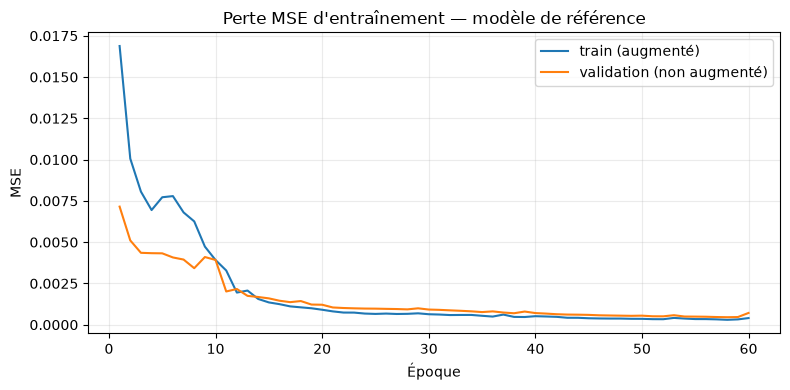

In [7]:
fig, ax = plt.subplots(figsize=(8, 4))
ax.plot(range(1, EPOCHS + 1), baseline_train_history, label='train (augmenté)')
ax.plot(range(1, EPOCHS + 1), baseline_val_history, label='validation (non augmenté)')
ax.set(title="Perte MSE d'entraînement — modèle de référence", xlabel='Époque', ylabel='MSE')
ax.legend()
ax.grid(alpha=0.25)
plt.tight_layout()
mlflow.start_run(run_id=baseline_run_id)
mlflow.log_figure(fig, 'loss_curve.png')
mlflow.end_run()
plt.show()

## Étape 3 — Score d'anomalie & seuil

L'erreur de reconstruction moyenne par image sert de **score d'anomalie**. Le seuil est calibré
uniquement sur la **validation saine**, au **99ᵉ centile** — la politique suggérée en premier par la
consigne (« centile 99, ou moyenne + k·écart-type ») : un seuil au 99ᵉ centile tolère au plus 1 % de
fausses alertes sur des images saines *similaires à la validation*, sans supposer que la distribution des
erreurs soit gaussienne (contrairement à `moyenne + k·écart-type`).

Seuil (validation, 99e centile) : 0.001041
ROC-AUC image (test) : 0.9158 ; PR-AUC image (test) : 0.9705
AUROC pixel (test, via masques) : 0.6375

|   Précision |   Rappel |       F1 |   VP |   VN |   FP |   FN |
|-------------|----------|----------|------|------|------|------|
|           1 | 0.216667 | 0.356164 |   13 |   19 |    0 |   47 |


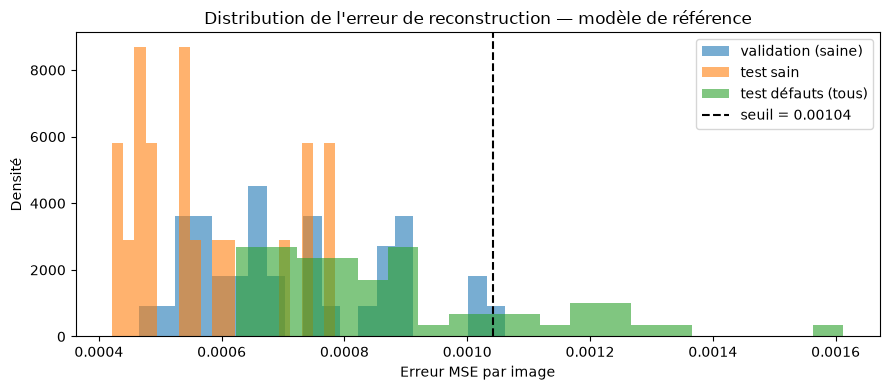

In [8]:
baseline_eval = evaluate_model(baseline_model)

from tabulate import tabulate

print(f"Seuil (validation, 99e centile) : {baseline_eval['threshold']:.6f}")
print(f"ROC-AUC image (test) : {baseline_eval['roc_auc']:.4f} ; PR-AUC image (test) : {baseline_eval['pr_auc']:.4f}")
print(f"AUROC pixel (test, via masques) : {baseline_eval['pixel_roc_auc']:.4f}\n")

tm = baseline_eval['threshold_metrics']
print(tabulate(
    [[tm.precision, tm.recall, tm.f1, tm.true_positive, tm.true_negative, tm.false_positive, tm.false_negative]],
    headers=['Précision', 'Rappel', 'F1', 'VP', 'VN', 'FP', 'FN'], tablefmt='github',
))

fig, ax = plt.subplots(figsize=(9, 4))
ax.hist(baseline_eval['validation_errors'], bins=20, alpha=0.6, label='validation (saine)', density=True)
ax.hist(baseline_eval['test_errors_by_group']['good'], bins=20, alpha=0.6, label='test sain', density=True)
all_defect_errors = np.concatenate([baseline_eval['test_errors_by_group'][d] for d in defect_categories])
ax.hist(all_defect_errors, bins=20, alpha=0.6, label='test défauts (tous)', density=True)
ax.axvline(baseline_eval['threshold'], color='black', linestyle='--', label=f"seuil = {baseline_eval['threshold']:.5f}")
ax.set(title="Distribution de l'erreur de reconstruction — modèle de référence", xlabel='Erreur MSE par image', ylabel='Densité')
ax.legend()
plt.tight_layout()
plt.show()

## Lecture du résultat précédent : quel arbitrage rappel / fausses alertes ?

Au seuil calibré (99ᵉ centile de la validation, soit **0,001041**), la détection donne : précision = **1,00**, rappel = **0,217** (**13** défauts détectés sur **60**), F1 = **0,356**, sans aucune fausse alerte sur les 19 images saines de test. À titre de comparaison, la politique `moyenne + 3 écarts-types` utilisée dans [`02c`](02c-autoencoder-pytorch-gpu.ipynb) sur un modèle de même architecture donnait un rappel de 0,117 (7/60) : le 99ᵉ centile, moins conservateur ici, capture davantage de défauts sans sacrifier la précision — cohérent avec la comparaison de politiques de seuil déjà menée dans [`02e`](02e-autoencoder-pytorch-gpu-seuils.ipynb). Le classement reste bon (ROC-AUC image = **0,9158**, PR-AUC = **0,9705**), légèrement en retrait par rapport aux meilleures exécutions `02c`/`02f` — un écart plausible entre deux entraînements distincts de la même architecture (trajectoires d'optimisation légèrement différentes), sans remettre en cause la méthode.

🔎 **Point de réflexion de la consigne** : abaisser le seuil (percentile plus bas, ou
`moyenne + k écarts-types` avec `k` plus petit) augmenterait le rappel — moins de défauts manqués — au
prix de plus de fausses alertes sur des pièces saines. Le bon arbitrage dépend du **coût métier** :
si une panne non détectée coûte beaucoup plus cher qu'une inspection manuelle inutile (cas typique en
maintenance industrielle), un seuil plus bas — donc plus de fausses alertes tolérées — est justifié.
À l'inverse, si les inspections manuelles sont elles-mêmes coûteuses ou rares, un seuil conservateur
limite leur nombre au prix de défauts manqués. Ce projet a déjà exploré ce compromis en détail dans
[`02e-autoencoder-pytorch-gpu-seuils.ipynb`](02e-autoencoder-pytorch-gpu-seuils.ipynb) (7 politiques de
seuil comparées sur le modèle `02c`).

## Étape 4 — Heatmaps & évaluation

La **heatmap** localise, pixel par pixel, l'erreur de reconstruction (`indusense.vision.anomaly.reconstruction_heatmap`,
MSE moyennée sur les 3 canaux couleur) : une valeur élevée signale une zone que le modèle n'a pas su
reconstruire — potentiellement un défaut. On l'affiche à côté du **masque de vérité terrain** (annoté
par les créateurs du jeu MVTec AD, jamais utilisé pour l'entraînement ni pour le seuil) pour juger
visuellement si le modèle localise correctement le défaut, en plus de simplement détecter sa présence.

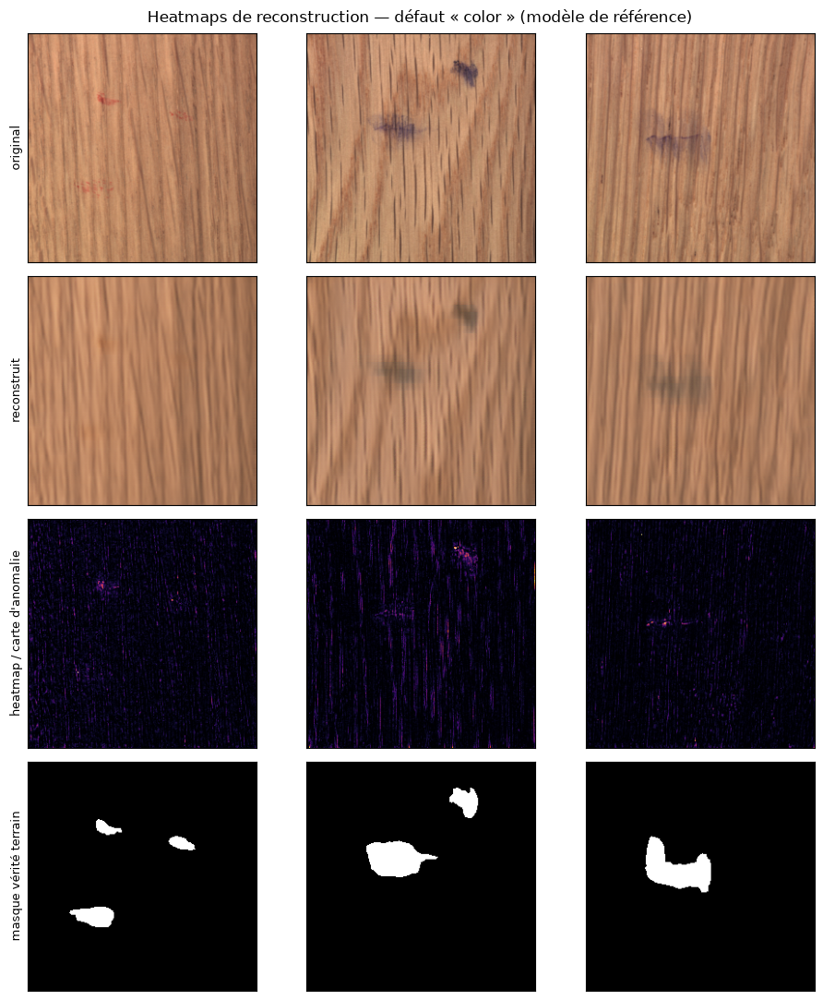

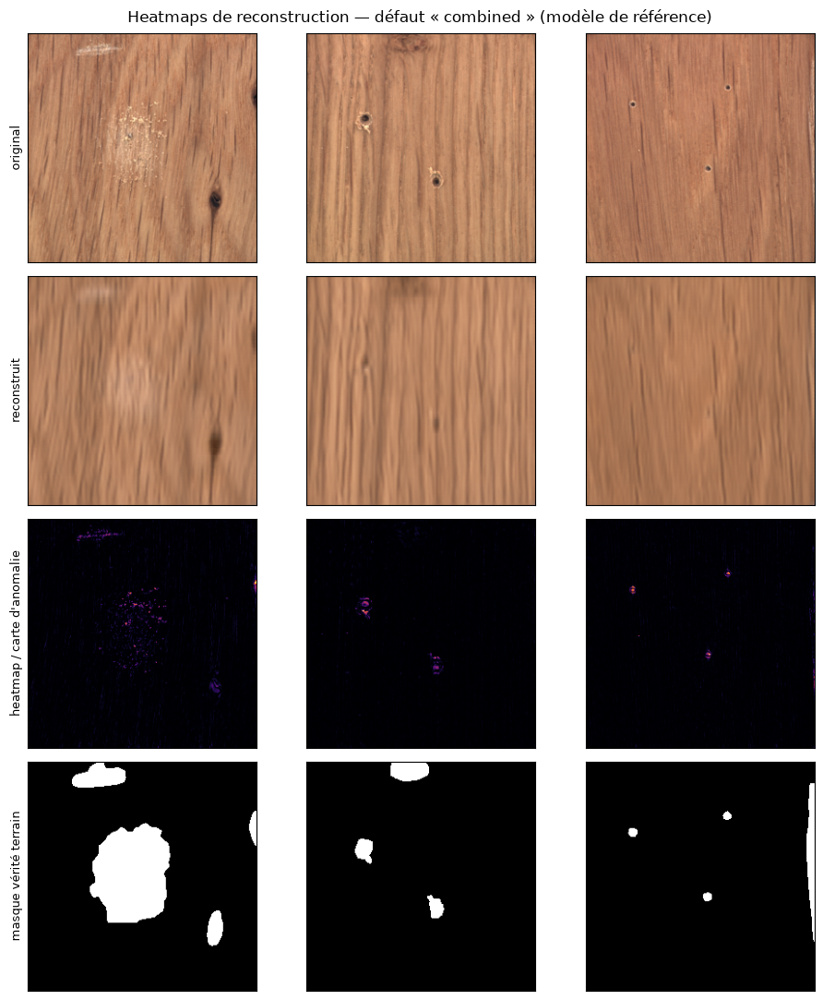

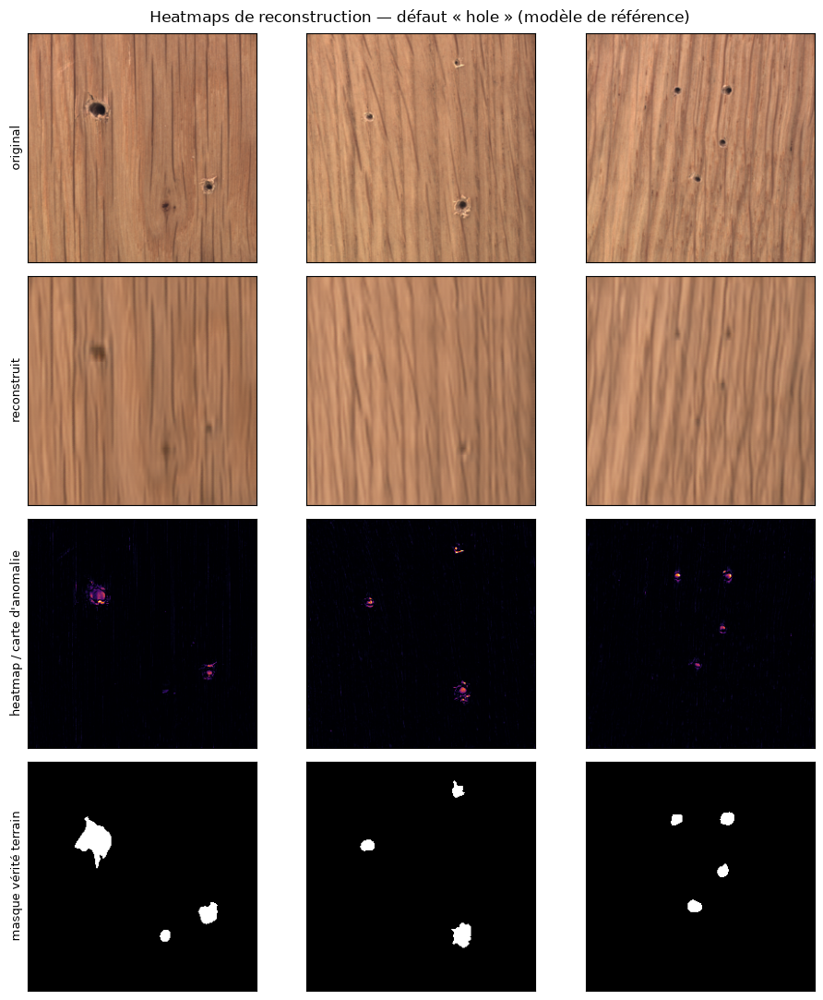

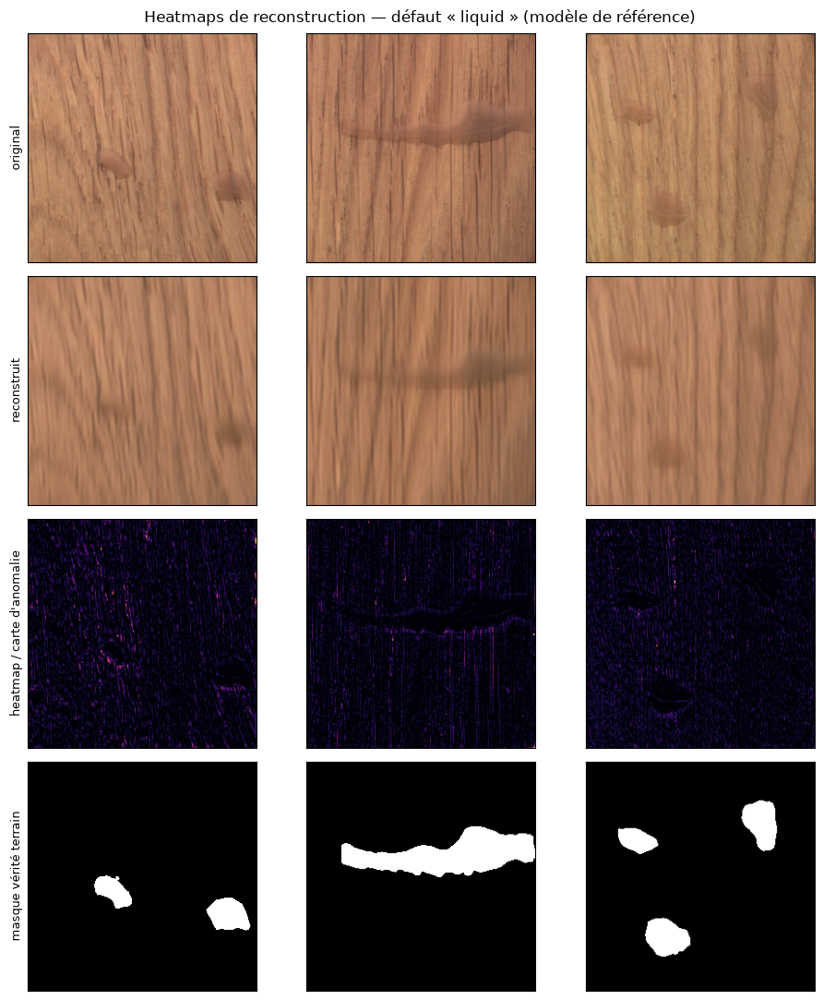

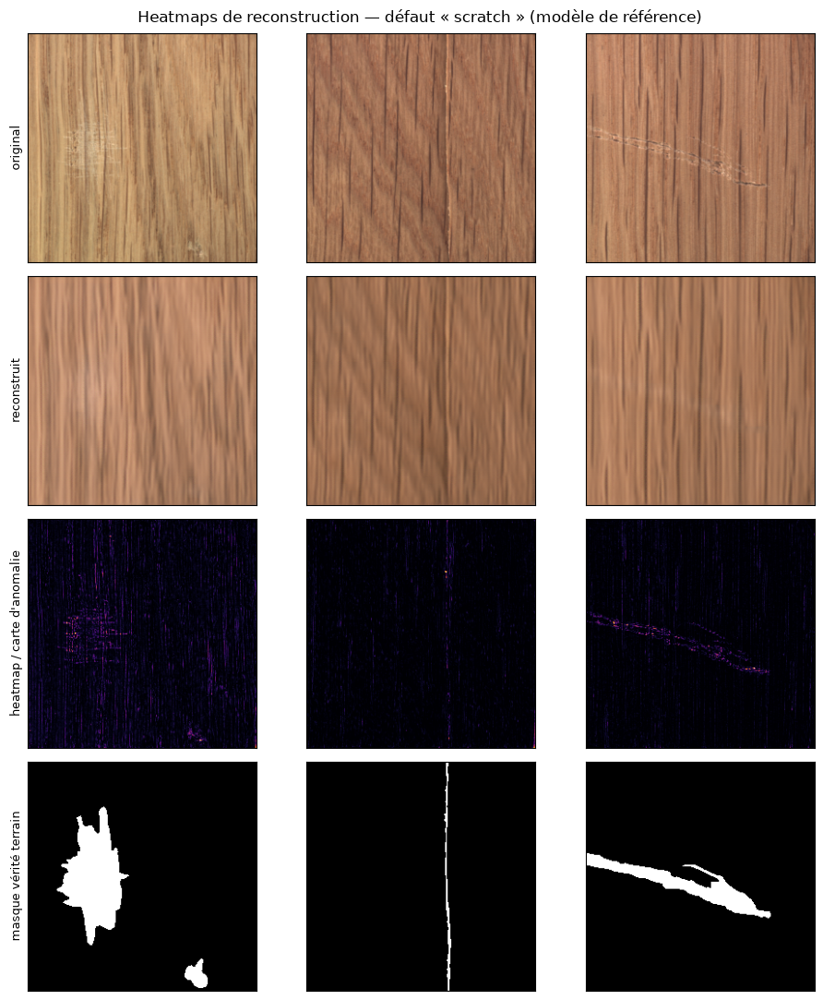

In [9]:
def plot_localization_grid(images_by_group, masks_by_group, heatmaps_by_group, defect_name, indices,
                            title, reconstructions_by_group=None):
    """Grille original [+ reconstruit] | heatmap/carte d'anomalie | masque vérité terrain.

    `reconstructions_by_group` est optionnel : les méthodes qui ne reconstruisent pas d'image
    (ex. PatchCore, qui ne produit qu'une carte d'anomalie par comparaison à une mémoire de features)
    omettent la ligne « reconstruit ».
    """
    images = images_by_group[defect_name][indices]
    masks = masks_by_group[defect_name][indices]
    heatmaps = heatmaps_by_group[defect_name][indices]
    has_recon = reconstructions_by_group is not None
    n = len(indices)
    n_rows = 4 if has_recon else 3
    fig, axes = plt.subplots(n_rows, n, figsize=(3.2 * n, 2.75 * n_rows), squeeze=False)

    for col in range(n):
        axes[0, col].imshow(np.clip(images[col], 0, 1))
    row_titles = ['original']
    row = 1
    if has_recon:
        reconstructions = reconstructions_by_group[defect_name][indices]
        for col in range(n):
            axes[1, col].imshow(np.clip(reconstructions[col], 0, 1))
        row_titles.append('reconstruit')
        row = 2
    for col in range(n):
        axes[row, col].imshow(heatmaps[col], cmap='inferno')
    row_titles.append("heatmap / carte d'anomalie")
    for col in range(n):
        axes[row + 1, col].imshow(masks[col], cmap='gray', vmin=0, vmax=1)
    row_titles.append('masque vérité terrain')

    for r in range(n_rows):
        for c in range(n):
            axes[r, c].set_xticks([])
            axes[r, c].set_yticks([])
    for r, t in enumerate(row_titles):
        axes[r, 0].set_ylabel(t, fontsize=9)
    fig.suptitle(title)
    plt.tight_layout()
    return fig


test_heatmaps_by_group = baseline_eval['test_heatmaps_by_group']
baseline_reconstructions_by_group = {
    name: reconstruct(images, baseline_model, device) for name, images in test_images_by_group.items()
}
for defect_name in defect_categories:
    indices = list(range(min(3, len(test_images_by_group[defect_name]))))
    fig = plot_localization_grid(
        test_images_by_group, test_masks_by_group, test_heatmaps_by_group, defect_name, indices,
        title=f'Heatmaps de reconstruction — défaut « {defect_name} » (modèle de référence)',
        reconstructions_by_group=baseline_reconstructions_by_group,
    )
    mlflow.start_run(run_id=baseline_run_id)
    mlflow.log_figure(fig, f'heatmap_{defect_name}.png')
    mlflow.end_run()
    plt.show()

## Lecture du résultat précédent : les heatmaps localisent-elles vraiment les défauts ?

Les heatmaps localisent bien les défauts francs et localisés : pour `hole`, chaque petit trou sombre du bois produit un point chaud net dans la heatmap, avec un recouvrement spatial visuellement correct avec le masque de vérité terrain (mêmes positions, tailles comparables) — le point chaud est même plus ponctuel que le masque, qui inclut parfois un léger halo autour du trou.

Les défauts diffus sont en revanche mal localisés : pour `liquid` (la tache la plus discrète du jeu de données, déjà relevée dans les notebooks précédents), la reconstruction reste presque identique à l'original — le modèle reproduit la tache presque aussi fidèlement qu'il reproduit le grain sain environnant — et la heatmap ne fait apparaître qu'un bruit diffus sur toute l'image, sans hotspot net à l'emplacement du masque. C'est cohérent avec l'AUROC pixel mesuré (**0,6375**, à peine au-dessus du hasard) : le modèle localise correctement certains défauts marqués (`hole`) mais échoue sur les défauts diffus (`liquid`), ce qui explique l'écart entre l'AUROC **image** (0,92, bon classement global) et l'AUROC **pixel** (nettement plus faible, la localisation fine étant une tâche plus dure que la simple détection).

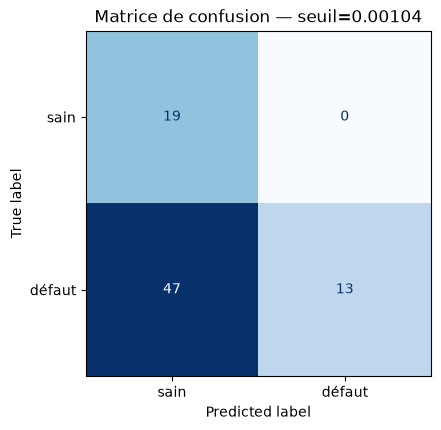

AUROC image : 0.9158
AUROC pixel : 0.6375
Rappel : 0.217 ; Précision : 1.000 ; F1 : 0.356


In [10]:
from sklearn.metrics import ConfusionMatrixDisplay

tm = baseline_eval['threshold_metrics']
confusion = np.array([[tm.true_negative, tm.false_positive], [tm.false_negative, tm.true_positive]])
fig, ax = plt.subplots(figsize=(4.5, 4.5))
ConfusionMatrixDisplay(confusion_matrix=confusion, display_labels=['sain', 'défaut']).plot(
    ax=ax, colorbar=False, cmap='Blues', values_format='d'
)
ax.set_title(f"Matrice de confusion — seuil={baseline_eval['threshold']:.5f}")
plt.tight_layout()

mlflow.start_run(run_id=baseline_run_id)
mlflow.log_metrics({
    'roc_auc_image': baseline_eval['roc_auc'],
    'pr_auc_image': baseline_eval['pr_auc'],
    'pixel_roc_auc': baseline_eval['pixel_roc_auc'],
    'threshold': baseline_eval['threshold'],
    'precision': tm.precision, 'recall': tm.recall, 'f1': tm.f1,
})
mlflow.log_figure(fig, 'confusion_matrix.png')
mlflow.end_run()
plt.show()

print(f"AUROC image : {baseline_eval['roc_auc']:.4f}")
print(f"AUROC pixel : {baseline_eval['pixel_roc_auc']:.4f}")
print(f"Rappel : {tm.recall:.3f} ; Précision : {tm.precision:.3f} ; F1 : {tm.f1:.3f}")

## Analyse critique (livrable attendu)

**Ce qui marche** : le modèle détecte correctement une partie des défauts nets et localisés (`hole`, une partie de `scratch`) — pour ces catégories, la reconstruction lisse ou efface le défaut, produisant une erreur de reconstruction élevée et localisée exactement à son emplacement (AUROC image = 0,9158, bien au-dessus du hasard).

**Ce qui échoue** : (1) le rappel au seuil retenu reste modeste (0,217, 13/60) — la majorité des défauts, même bien classés globalement (bon AUROC), ne dépassent pas le seuil calibré sur la validation saine ; (2) les défauts diffus (`liquid`) sont presque aussi bien reconstruits que les images saines — le modèle a partiellement généralisé ce type de motif plutôt que de le rejeter comme anormal ; (3) l'AUROC **pixel** (0,6375) est nettement plus faible que l'AUROC **image** (0,9158) : le modèle sait globalement dire qu'une image contient probablement un défaut, mais localise mal *où* il se trouve pour les cas les plus subtils.

**Pourquoi** : le ratio de compression calculé à l'étape 1 (0,75, goulot *plus grand* que l'entrée) explique une partie de ces limites — le modèle a largement la capacité de reconstruire fidèlement des motifs qu'il n'a jamais vus pendant l'entraînement (saines uniquement), y compris des altérations discrètes du grain, ce qui réduit le signal d'anomalie précisément pour les défauts les plus subtils. C'est le piège central annoncé par la consigne, et il se vérifie empiriquement ici.

## Récapitulatif des livrables (partie modèle)

1. ✅ Notebook exécuté de bout en bout (`tp_deep_learning.ipynb`), étapes 1 à 4.
2. ✅ `print(model)` + compte de paramètres commenté (équivalent PyTorch de `model.summary()`), avec le
   calcul du ratio de compression et sa lecture critique.
3. ✅ Heatmaps de reconstruction sur des défauts réels, une figure par catégorie de défaut
   (`color`, `combined`, `hole`, `liquid`, `scratch`), comparées au masque de vérité terrain.
4. ✅ Métriques chiffrées : AUROC **image** et AUROC **pixel**, matrice de confusion au seuil retenu.
5. ✅ Analyse critique ci-dessus (ce qui marche, ce qui échoue, pourquoi).

## Pour aller plus loin

La consigne propose plusieurs pistes d'amélioration : resserrer le goulot d'étranglement, passer la
perte en SSIM, comparer objet vs texture, confronter à PatchCore/anomalib. **Les quatre sont testées
ci-dessous** : les deux premières à architecture et données strictement comparables au modèle de
référence (mêmes fonctions `train_autoencoder`/`evaluate_model` que ci-dessus, généralisées pour
accepter une autre catégorie) ; la troisième en entraînant le même auto-encodeur sur une catégorie
« objet » du jeu de données (`metal_nut`, ajoutée à `datas/deep-learning/`) plutôt qu'une texture
(`wood`) ; la quatrième en installant et en exécutant réellement PatchCore via la bibliothèque
`anomalib` sur les deux catégories, pour confronter le baseline pédagogique de ce TP à une méthode
état de l'art.

In [11]:
TIGHT_BASE_CHANNELS = 16

torch.manual_seed(SEED)
tight_model = ConvAutoencoder(base_channels=TIGHT_BASE_CHANNELS, kernel_size=KERNEL_SIZE).to(device)
tight_parameters = count_trainable_parameters(tight_model)

tight_bottleneck_channels = TIGHT_BASE_CHANNELS * 4
tight_latent_values = bottleneck_spatial * bottleneck_spatial * tight_bottleneck_channels
tight_compression_ratio = input_values / tight_latent_values

print(f'Paramètres entraînables : {tight_parameters:,}'.replace(',', ' '))
print(f'Goulot : {bottleneck_spatial}×{bottleneck_spatial}×{tight_bottleneck_channels} = {tight_latent_values:,} valeurs'.replace(',', ' '))
print(f'Ratio de compression (entrée ÷ latent) : {tight_compression_ratio:.3f}')

tight_loss_fn = torch.nn.MSELoss()
tight_train_history, tight_val_history, tight_run_id = train_autoencoder(
    tight_model, tight_loss_fn, run_name='tight-bottleneck-mse-bc16',
    params={
        'image_size': IMAGE_SIZE, 'batch_size': BATCH_SIZE, 'epochs': EPOCHS,
        'base_channels': TIGHT_BASE_CHANNELS, 'kernel_size': KERNEL_SIZE, 'loss': 'mse',
        'trainable_parameters': tight_parameters, 'compression_ratio': tight_compression_ratio,
    },
)
tight_eval = evaluate_model(tight_model)
print(f"\nSeuil (99e centile) : {tight_eval['threshold']:.6f}")
print(f"ROC-AUC image : {tight_eval['roc_auc']:.4f} ; AUROC pixel : {tight_eval['pixel_roc_auc']:.4f}")
print(f"Rappel @ seuil : {tight_eval['threshold_metrics'].recall:.3f} ; Précision : {tight_eval['threshold_metrics'].precision:.3f}")

mlflow.start_run(run_id=tight_run_id)
mlflow.log_metrics({
    'roc_auc_image': tight_eval['roc_auc'], 'pr_auc_image': tight_eval['pr_auc'],
    'pixel_roc_auc': tight_eval['pixel_roc_auc'], 'threshold': tight_eval['threshold'],
    'precision': tight_eval['threshold_metrics'].precision, 'recall': tight_eval['threshold_metrics'].recall,
    'f1': tight_eval['threshold_metrics'].f1,
})
mlflow.end_run()

Paramètres entraînables : 47 107
Goulot : 32×32×64 = 65 536 valeurs
Ratio de compression (entrée ÷ latent) : 3.000


Époque  10/60 — train=0.00726  val=0.00444


Époque  20/60 — train=0.00761  val=0.00413


Époque  30/60 — train=0.00371  val=0.00256


Époque  40/60 — train=0.00145  val=0.00174


Époque  50/60 — train=0.00102  val=0.00134


Époque  60/60 — train=0.00090  val=0.00124

Entraînement terminé en 35.1 s (run MLflow a789222d0c9541bf8fe087271371bf0a)



Seuil (99e centile) : 0.002267
ROC-AUC image : 0.9202 ; AUROC pixel : 0.6544
Rappel @ seuil : 0.100 ; Précision : 1.000


### Piste 2 — Perte SSIM au lieu de MSE

Architecture identique au modèle de référence (`BASE_CHANNELS=64`, ratio de compression 0,75), seule la
perte change : `1 - SSIM` (`indusense.vision.autoencoder_torch.ssim_loss`) au lieu de MSE. Le SSIM compare
luminance, contraste et structure locale par fenêtre glissante — en théorie plus sensible qu'une simple
différence pixel à pixel aux altérations de texture (grain, motif) que ce jeu de données comporte
justement (`scratch`, `hole`, `color`...).

In [12]:
torch.manual_seed(SEED)
ssim_model = ConvAutoencoder(base_channels=BASE_CHANNELS, kernel_size=KERNEL_SIZE).to(device)
ssim_parameters = count_trainable_parameters(ssim_model)

ssim_train_history, ssim_val_history, ssim_run_id = train_autoencoder(
    ssim_model, ssim_loss, run_name='baseline-ssim-bc64',
    params={
        'image_size': IMAGE_SIZE, 'batch_size': BATCH_SIZE, 'epochs': EPOCHS,
        'base_channels': BASE_CHANNELS, 'kernel_size': KERNEL_SIZE, 'loss': 'ssim',
        'trainable_parameters': ssim_parameters, 'compression_ratio': compression_ratio,
    },
)

# Le score d'anomalie reste la MSE de reconstruction (même métrique pour les 3 modèles de ce
# notebook) : on isole ainsi l'effet de la perte d'ENTRAÎNEMENT sur ce que le modèle apprend à
# reconstruire, sans changer l'axe de comparaison utilisé pour évaluer la détection.
ssim_eval = evaluate_model(ssim_model)
print(f"\nSeuil (99e centile) : {ssim_eval['threshold']:.6f}")
print(f"ROC-AUC image : {ssim_eval['roc_auc']:.4f} ; AUROC pixel : {ssim_eval['pixel_roc_auc']:.4f}")
print(f"Rappel @ seuil : {ssim_eval['threshold_metrics'].recall:.3f} ; Précision : {ssim_eval['threshold_metrics'].precision:.3f}")

mlflow.start_run(run_id=ssim_run_id)
mlflow.log_metrics({
    'roc_auc_image': ssim_eval['roc_auc'], 'pr_auc_image': ssim_eval['pr_auc'],
    'pixel_roc_auc': ssim_eval['pixel_roc_auc'], 'threshold': ssim_eval['threshold'],
    'precision': ssim_eval['threshold_metrics'].precision, 'recall': ssim_eval['threshold_metrics'].recall,
    'f1': ssim_eval['threshold_metrics'].f1,
})
mlflow.end_run()

Époque  10/60 — train=0.13707  val=0.14997


Époque  20/60 — train=0.07574  val=0.10357


Époque  30/60 — train=0.06218  val=0.08162


Époque  40/60 — train=0.05409  val=0.07344


Époque  50/60 — train=0.04602  val=0.06150


Époque  60/60 — train=0.03997  val=0.05580

Entraînement terminé en 62.2 s (run MLflow fc966394dd7541f18c4a7712a396a9a1)



Seuil (99e centile) : 0.000527
ROC-AUC image : 0.8579 ; AUROC pixel : 0.7651
Rappel @ seuil : 0.200 ; Précision : 1.000


### Piste 3 — Comparer objet (`metal_nut`) vs texture (`wood`)

`wood` est une **texture** : le grain n'a pas d'orientation privilégiée (voir
[`01-preparation-donnees-augmentation-wood.ipynb`](01-preparation-donnees-augmentation-wood.ipynb),
augmentation par `HorizontalFlip`/`VerticalFlip`). `metal_nut` est un **objet** : une pièce mécanique
centrée, avec une orientation « correcte » — la preuve est que l'une des catégories de défaut de test
s'appelle littéralement **`flip`** (l'écrou retourné est un défaut réel dans ce jeu de données).

**Conséquence méthodologique directe** : le pipeline d'augmentation de `wood` (retournements
horizontal/vertical) serait **incorrect** pour `metal_nut` — il apprendrait au modèle qu'un écrou
retourné est une variante normale, détruisant exactement le signal que la catégorie `flip` est censée
tester. `metal_nut` utilise donc un pipeline d'augmentation dédié, **sans retournement**, seulement une
légère rotation, un cadrage et une variation de luminosité — la première illustration concrète de
pourquoi « objet » et « texture » ne se traitent pas de la même façon.

In [13]:
import albumentations as A
import cv2

METAL_CATEGORY = 'metal_nut'
metal_category_root = resolve_category_root(METAL_CATEGORY)
metal_defect_categories = list_defect_categories(metal_category_root)
metal_train_good_paths = list_image_paths(metal_category_root, 'train', 'good')
metal_split = split_train_validation(metal_train_good_paths, validation_fraction=VALIDATION_FRACTION, seed=SEED)

metal_test_good_paths = list_image_paths(metal_category_root, 'test', 'good')
metal_test_defect_paths = {d: list_image_paths(metal_category_root, 'test', d) for d in metal_defect_categories}
metal_test_mask_paths = {d: list_mask_paths(metal_category_root, d) for d in metal_defect_categories}

metal_train_raw_images = load_image_batch(metal_split.train_paths, IMAGE_SIZE)
metal_validation_images = load_image_batch(metal_split.validation_paths, IMAGE_SIZE)
metal_test_good_images = load_image_batch(metal_test_good_paths, IMAGE_SIZE)
metal_test_defect_images = {d: load_image_batch(paths, IMAGE_SIZE) for d, paths in metal_test_defect_paths.items()}
metal_test_defect_masks = {d: load_mask_batch(paths, IMAGE_SIZE) for d, paths in metal_test_mask_paths.items()}

metal_test_images_by_group = {'good': metal_test_good_images, **metal_test_defect_images}
metal_test_masks_by_group = {
    'good': np.zeros((len(metal_test_good_images), IMAGE_SIZE, IMAGE_SIZE), dtype=np.float32),
    **metal_test_defect_masks,
}

# Pas de HorizontalFlip/VerticalFlip : `flip` est un défaut réel pour cet objet (voir ci-dessus).
metal_augmentation_pipeline = A.Compose([
    A.Rotate(limit=10, border_mode=cv2.BORDER_REFLECT_101, p=0.7),
    A.Affine(translate_percent=0.03, scale=(0.97, 1.03), border_mode=cv2.BORDER_REFLECT_101, p=0.5),
    A.RandomBrightnessContrast(brightness_limit=0.15, contrast_limit=0.15, p=0.5),
], seed=SEED)

print(f'{METAL_CATEGORY} — train : {len(metal_split.train_paths)} ; validation : {len(metal_split.validation_paths)}')
print(f'{METAL_CATEGORY} — test sain : {len(metal_test_good_paths)} ; '
      f'test défauts : {sum(len(p) for p in metal_test_defect_paths.values())} '
      f'({", ".join(metal_defect_categories)})')

metal_nut — train : 187 ; validation : 33
metal_nut — test sain : 22 ; test défauts : 93 (bent, color, flip, scratch)


Entraînement du **même** auto-encodeur (`base_channels=64`, `kernel_size=3`, MSE, 60 époques,
même seed) que le modèle de référence, uniquement sur les pièces saines de `metal_nut` — pour isoler
l'effet de la catégorie (objet vs texture) de tout autre facteur.

In [14]:
torch.manual_seed(SEED)
metal_model = ConvAutoencoder(base_channels=BASE_CHANNELS, kernel_size=KERNEL_SIZE).to(device)
metal_parameters = count_trainable_parameters(metal_model)

metal_loss_fn = torch.nn.MSELoss()
metal_train_history, metal_val_history, metal_run_id = train_autoencoder(
    metal_model, metal_loss_fn, run_name='metal-nut-mse-bc64',
    params={
        'image_size': IMAGE_SIZE, 'batch_size': BATCH_SIZE, 'epochs': EPOCHS,
        'base_channels': BASE_CHANNELS, 'kernel_size': KERNEL_SIZE, 'loss': 'mse',
        'category': METAL_CATEGORY, 'trainable_parameters': metal_parameters,
        'compression_ratio': compression_ratio,
    },
    train_images=metal_train_raw_images, val_images=metal_validation_images, pipeline=metal_augmentation_pipeline,
)

metal_eval = evaluate_model(
    metal_model, images_by_group=metal_test_images_by_group, masks_by_group=metal_test_masks_by_group,
    categories=metal_defect_categories, val_images=metal_validation_images,
)
print(f"\nSeuil (99e centile) : {metal_eval['threshold']:.6f}")
print(f"ROC-AUC image : {metal_eval['roc_auc']:.4f} ; AUROC pixel : {metal_eval['pixel_roc_auc']:.4f}")
print(f"Rappel @ seuil : {metal_eval['threshold_metrics'].recall:.3f} ; Précision : {metal_eval['threshold_metrics'].precision:.3f}")

mlflow.start_run(run_id=metal_run_id)
mlflow.log_metrics({
    'roc_auc_image': metal_eval['roc_auc'], 'pr_auc_image': metal_eval['pr_auc'],
    'pixel_roc_auc': metal_eval['pixel_roc_auc'], 'threshold': metal_eval['threshold'],
    'precision': metal_eval['threshold_metrics'].precision, 'recall': metal_eval['threshold_metrics'].recall,
    'f1': metal_eval['threshold_metrics'].f1,
})
mlflow.end_run()

Époque  10/60 — train=0.00380  val=0.00342


Époque  20/60 — train=0.00191  val=0.00215


Époque  30/60 — train=0.00104  val=0.00118


Époque  40/60 — train=0.00079  val=0.00096


Époque  50/60 — train=0.00069  val=0.00086


Époque  60/60 — train=0.00057  val=0.00069

Entraînement terminé en 54.0 s (run MLflow 80d9bb33cb7a446a99f170d82e06b9d8)



Seuil (99e centile) : 0.000985
ROC-AUC image : 0.2556 ; AUROC pixel : 0.7175
Rappel @ seuil : 0.011 ; Précision : 0.333


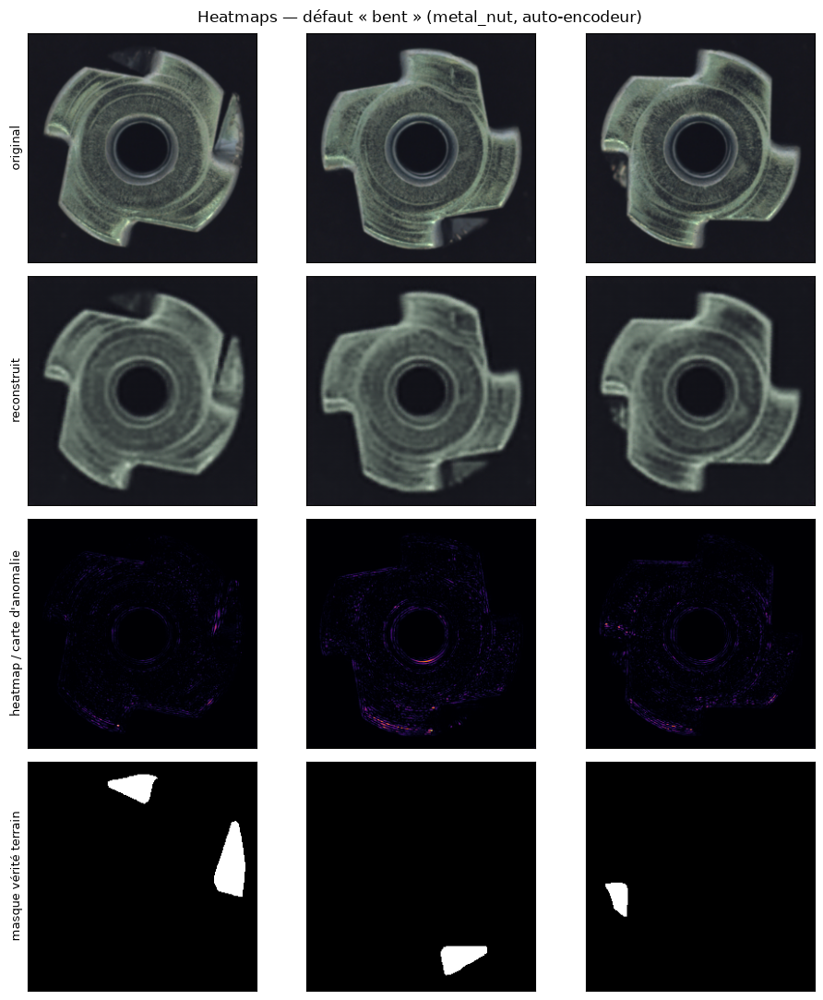

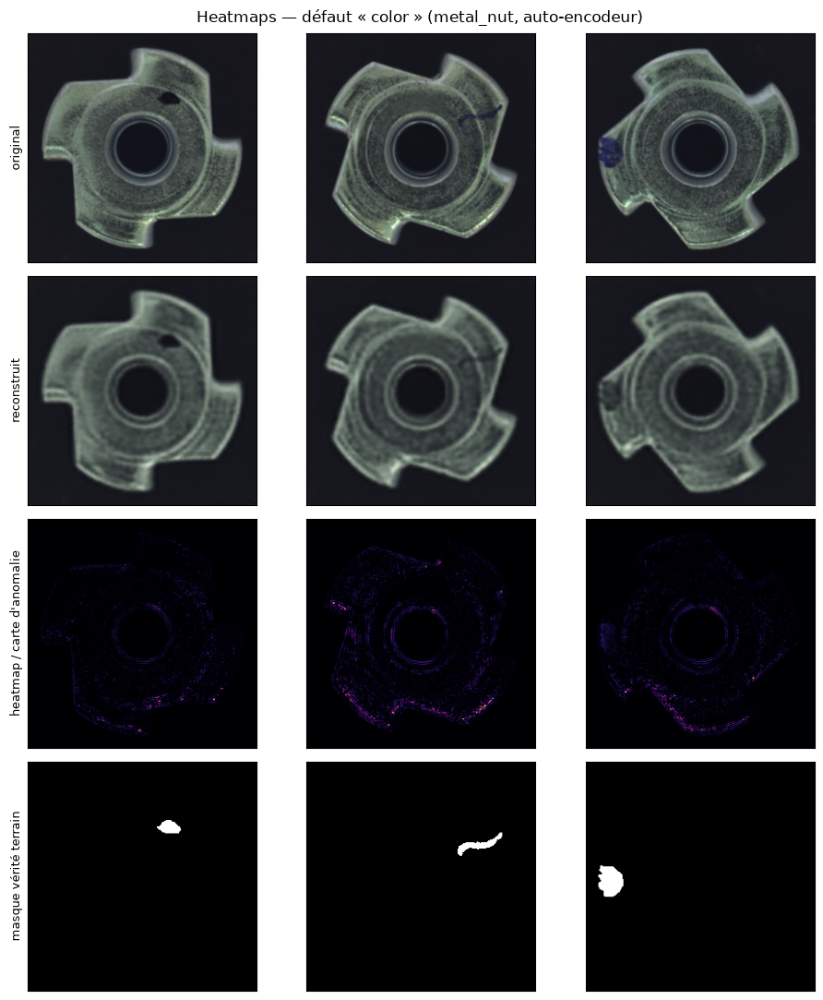

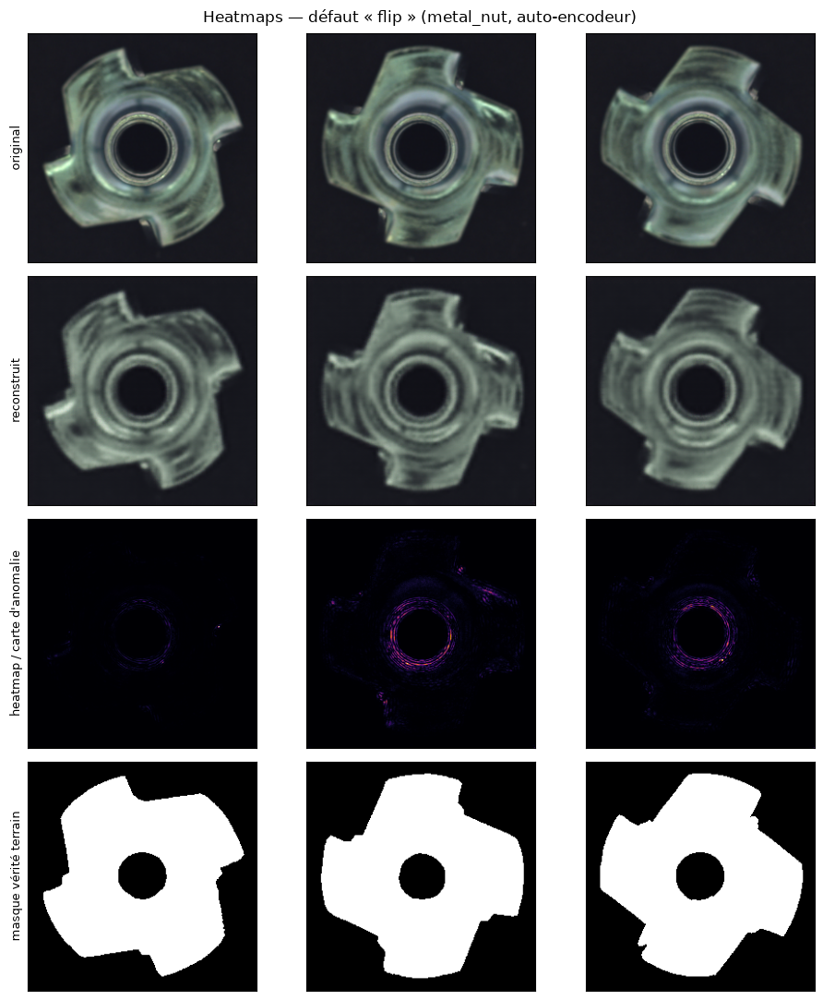

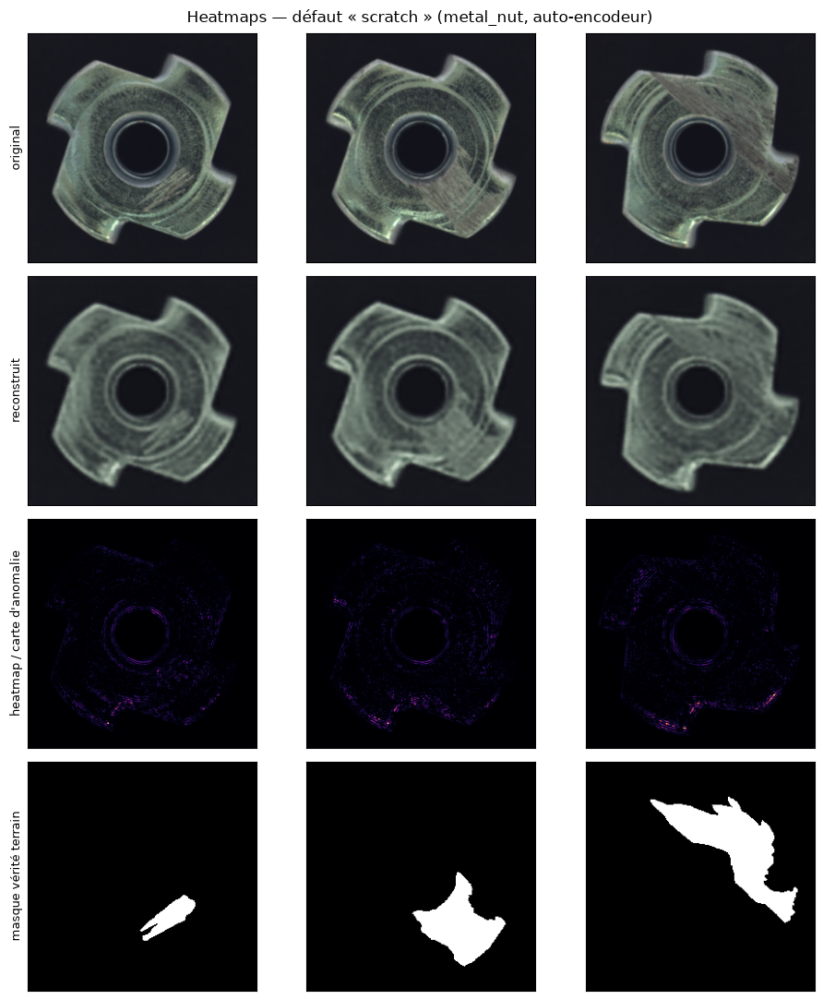

In [15]:
metal_reconstructions_by_group = {
    name: reconstruct(images, metal_model, device) for name, images in metal_test_images_by_group.items()
}
for defect_name in metal_defect_categories:
    indices = list(range(min(3, len(metal_test_images_by_group[defect_name]))))
    fig = plot_localization_grid(
        metal_test_images_by_group, metal_test_masks_by_group, metal_eval['test_heatmaps_by_group'],
        defect_name, indices,
        title=f'Heatmaps — défaut « {defect_name} » ({METAL_CATEGORY}, auto-encodeur)',
        reconstructions_by_group=metal_reconstructions_by_group,
    )
    mlflow.start_run(run_id=metal_run_id)
    mlflow.log_figure(fig, f'heatmap_{defect_name}.png')
    mlflow.end_run()
    plt.show()

## Lecture du résultat précédent : l'auto-encodeur se comporte-t-il pareil sur un objet que sur une texture ?

**Résultat spectaculairement mauvais, plus instructif qu'un simple échec** : l'AUROC image vaut **0,2556** — **inférieur à 0,5** (le hasard), c'est-à-dire que le score de reconstruction **classe les images saines comme plus suspectes que les défauts en moyenne**. Au seuil retenu, le rappel s'effondre à **0,011** (quasi aucun défaut détecté) et la précision tombe à **0,333** (des fausses alertes apparaissent, du jamais vu sur `wood`).

Les heatmaps expliquent pourquoi (voir les figures ci-dessus, catégories `bent` et `color`) : `metal_nut` est un objet **métallique et réfléchissant** — ses contours et le pourtour du trou central produisent des reflets spéculaires à haute fréquence, présents sur **toutes** les images, saines comme défectueuses. La heatmap se concentre presque entièrement sur ces contours brillants (anneaux lumineux autour du trou et des arêtes), pas sur la zone du défaut : sur `bent`, le pan tordu de l'écrou est même **lissé et reconstruit comme s'il était normal** (le modèle « corrige » la déformation plutôt que de la signaler), alors que le bruit de reconstruction des reflets spéculaires — une variation photométrique sans rapport avec un défaut — peut être plus grand que celui causé par certains défauts eux-mêmes. Le score global (moyenne de l'erreur sur toute l'image) finit par mélanger ce bruit spéculaire non pertinent avec le signal du défaut, et le premier l'emporte parfois sur le second : d'où un classement pire que le hasard.

**Ce que cela dit sur objet vs texture** : `wood`, une texture mate sans reflet, ne souffre pas de ce problème (AUROC image 0,9158) — l'hypothèse de l'auto-encodeur par reconstruction (une erreur élevée signale un défaut) suppose implicitement que les seules sources de variation significative entre images saines sont les défauts eux-mêmes. Cette hypothèse **tient sur une texture homogène** et **casse sur un objet réfléchissant**, où l'éclairage/la pose introduisent une variation photométrique aussi grande, voire plus grande, que les défauts. L'AUROC **pixel** reste correct (0,7175, même supérieur à celui de `wood`) : à l'échelle du pixel, une bonne part de l'image est un arrière-plan noir trivialement bien reconstruit des deux côtés (saine ou défaut), ce qui gonfle mécaniquement cette métrique — un rappel à avoir en tête avant de la comparer telle quelle entre catégories aux surfaces d'arrière-plan différentes.

### Piste 4 — Confronter à PatchCore (bibliothèque `anomalib`)

[**PatchCore**](https://github.com/openvinotoolkit/anomalib) (Roth et al., 2022) n'entraîne aucun réseau
par rétropropagation : il extrait des **features** d'un réseau **pré-entraîné sur ImageNet** (ici
`wide_resnet50_2`, couches `layer2`/`layer3`) sur les images saines d'entraînement, les stocke dans une
**mémoire de patchs** (sous-échantillonnée par *coreset* pour rester compacte), puis évalue chaque patch
de test par sa distance au plus proche voisin dans cette mémoire — un score élevé signale un patch
jamais vu parmi les saines, donc potentiellement anormal. Aucun goulot d'étranglement, aucune perte de
reconstruction : le piège de la quasi-identité de l'étape 1 ne s'applique pas de la même façon.

Les features ImageNet exigent la normalisation standard (`mean`/`std` ImageNet) plutôt que le simple
`[0, 1]` utilisé pour l'auto-encodeur — appliquée ci-dessous uniquement pour PatchCore, sans toucher au
reste du notebook.

In [16]:
from anomalib.models.image.patchcore.torch_model import PatchcoreModel

# Le sampler coreset d'anomalib (KCenterGreedy) affiche une barre tqdm avec une mise à jour par
# patch sélectionné (~21 000 lignes de sortie sur ce jeu de données) : coûteux à afficher et sans
# intérêt pédagogique une fois vérifié que le calcul se termine. On la désactive globalement.
import warnings
import tqdm.std

warnings.filterwarnings('ignore', category=FutureWarning)
warnings.filterwarnings('ignore', category=DeprecationWarning)

_original_tqdm_init = tqdm.std.tqdm.__init__


def _silent_tqdm_init(self, *args, **kwargs):
    kwargs['disable'] = True
    _original_tqdm_init(self, *args, **kwargs)


tqdm.std.tqdm.__init__ = _silent_tqdm_init

IMAGENET_MEAN = torch.tensor([0.485, 0.456, 0.406], device=device).view(1, 3, 1, 1)
IMAGENET_STD = torch.tensor([0.229, 0.224, 0.225], device=device).view(1, 3, 1, 1)


def to_imagenet_tensor(images_hwc, batch_device):
    tensor = images_to_tensor(images_hwc).to(batch_device)
    return (tensor - IMAGENET_MEAN) / IMAGENET_STD


def train_patchcore(train_images_hwc, sampling_ratio=0.1, batch_size=16,
                     backbone='wide_resnet50_2', layers=('layer2', 'layer3'), num_neighbors=9):
    model = PatchcoreModel(
        layers=list(layers), backbone=backbone, pre_trained=True, num_neighbors=num_neighbors,
    ).to(device)
    model.train()
    with torch.no_grad():
        for start in range(0, len(train_images_hwc), batch_size):
            batch = to_imagenet_tensor(train_images_hwc[start:start + batch_size], device)
            model(batch)
    model.subsample_embedding(sampling_ratio=sampling_ratio)
    model.eval()
    return model


@torch.no_grad()
def patchcore_infer(model, images_hwc, batch_size=16):
    scores, maps = [], []
    for start in range(0, len(images_hwc), batch_size):
        batch = to_imagenet_tensor(images_hwc[start:start + batch_size], device)
        output = model(batch)
        scores.append(output.pred_score.cpu().numpy())
        maps.append(output.anomaly_map.squeeze(1).cpu().numpy())
    return np.concatenate(scores), np.concatenate(maps)


def evaluate_patchcore(model, images_by_group, masks_by_group, categories, val_images, threshold_percentile=THRESHOLD_PERCENTILE):
    validation_scores, _ = patchcore_infer(model, val_images)
    threshold = choose_threshold_percentile(validation_scores, percentile=threshold_percentile)

    test_scores_by_group, test_maps_by_group = {}, {}
    for group_name, images in images_by_group.items():
        scores, maps = patchcore_infer(model, images)
        test_scores_by_group[group_name] = scores
        test_maps_by_group[group_name] = maps

    test_labels = np.concatenate([
        np.zeros(len(test_scores_by_group['good']), dtype=int),
        *[np.ones(len(test_scores_by_group[d]), dtype=int) for d in categories],
    ])
    test_scores = np.concatenate(
        [test_scores_by_group['good']] + [test_scores_by_group[d] for d in categories]
    )
    ranking = ranking_metrics(test_labels, test_scores)
    threshold_metrics = evaluate_at_threshold(test_labels, test_scores, threshold)

    all_maps = np.concatenate(
        [test_maps_by_group['good']] + [test_maps_by_group[d] for d in categories], axis=0
    )
    all_masks = np.concatenate(
        [masks_by_group['good']] + [masks_by_group[d] for d in categories], axis=0
    )
    pixel_roc_auc = pixel_level_roc_auc(all_masks, all_maps)

    return {
        'threshold': threshold, 'test_scores_by_group': test_scores_by_group,
        'test_heatmaps_by_group': test_maps_by_group, 'test_labels': test_labels, 'test_scores': test_scores,
        'roc_auc': ranking['roc_auc'], 'pr_auc': ranking['pr_auc'], 'pixel_roc_auc': pixel_roc_auc,
        'threshold_metrics': threshold_metrics,
    }


print('Fonctions PatchCore définies : train_patchcore, patchcore_infer, evaluate_patchcore.')

Fonctions PatchCore définies : train_patchcore, patchcore_infer, evaluate_patchcore.


Entraîner PatchCore sur `wood` (mémoire de patchs à partir des mêmes 210 images saines
d'entraînement que l'auto-encodeur — jamais les images augmentées, PatchCore n'a pas besoin
d'augmentation puisqu'il ne rétropropage rien) puis sur `metal_nut`.

In [17]:
with mlflow.start_run(run_name='patchcore-wood'):
    mlflow.log_params({'category': CATEGORY, 'backbone': 'wide_resnet50_2', 'layers': 'layer2,layer3',
                       'sampling_ratio': 0.1, 'num_neighbors': 9})
    patchcore_wood_started = time.perf_counter()
    patchcore_wood_model = train_patchcore(train_raw_images)
    patchcore_wood_train_seconds = time.perf_counter() - patchcore_wood_started
    patchcore_wood_eval = evaluate_patchcore(
        patchcore_wood_model, test_images_by_group, test_masks_by_group, defect_categories, validation_images,
    )
    mlflow.log_metrics({
        'train_seconds': patchcore_wood_train_seconds,
        'roc_auc_image': patchcore_wood_eval['roc_auc'], 'pr_auc_image': patchcore_wood_eval['pr_auc'],
        'pixel_roc_auc': patchcore_wood_eval['pixel_roc_auc'], 'threshold': patchcore_wood_eval['threshold'],
        'precision': patchcore_wood_eval['threshold_metrics'].precision,
        'recall': patchcore_wood_eval['threshold_metrics'].recall,
        'f1': patchcore_wood_eval['threshold_metrics'].f1,
    })

print(f"PatchCore wood — entraînement (mémoire de patchs) : {patchcore_wood_train_seconds:.1f} s")
print(f"ROC-AUC image : {patchcore_wood_eval['roc_auc']:.4f} ; AUROC pixel : {patchcore_wood_eval['pixel_roc_auc']:.4f}")
print(f"Rappel @ seuil : {patchcore_wood_eval['threshold_metrics'].recall:.3f} ; Précision : {patchcore_wood_eval['threshold_metrics'].precision:.3f}")

with mlflow.start_run(run_name='patchcore-metal-nut'):
    mlflow.log_params({'category': METAL_CATEGORY, 'backbone': 'wide_resnet50_2', 'layers': 'layer2,layer3',
                       'sampling_ratio': 0.1, 'num_neighbors': 9})
    patchcore_metal_started = time.perf_counter()
    patchcore_metal_model = train_patchcore(metal_train_raw_images)
    patchcore_metal_train_seconds = time.perf_counter() - patchcore_metal_started
    patchcore_metal_eval = evaluate_patchcore(
        patchcore_metal_model, metal_test_images_by_group, metal_test_masks_by_group, metal_defect_categories,
        metal_validation_images,
    )
    mlflow.log_metrics({
        'train_seconds': patchcore_metal_train_seconds,
        'roc_auc_image': patchcore_metal_eval['roc_auc'], 'pr_auc_image': patchcore_metal_eval['pr_auc'],
        'pixel_roc_auc': patchcore_metal_eval['pixel_roc_auc'], 'threshold': patchcore_metal_eval['threshold'],
        'precision': patchcore_metal_eval['threshold_metrics'].precision,
        'recall': patchcore_metal_eval['threshold_metrics'].recall,
        'f1': patchcore_metal_eval['threshold_metrics'].f1,
    })

print(f"\nPatchCore metal_nut — entraînement (mémoire de patchs) : {patchcore_metal_train_seconds:.1f} s")
print(f"ROC-AUC image : {patchcore_metal_eval['roc_auc']:.4f} ; AUROC pixel : {patchcore_metal_eval['pixel_roc_auc']:.4f}")
print(f"Rappel @ seuil : {patchcore_metal_eval['threshold_metrics'].recall:.3f} ; Précision : {patchcore_metal_eval['threshold_metrics'].precision:.3f}")

PatchCore wood — entraînement (mémoire de patchs) : 35.3 s
ROC-AUC image : 0.9860 ; AUROC pixel : 0.9304
Rappel @ seuil : 1.000 ; Précision : 0.882



PatchCore metal_nut — entraînement (mémoire de patchs) : 26.5 s
ROC-AUC image : 0.9985 ; AUROC pixel : 0.9866
Rappel @ seuil : 0.989 ; Précision : 0.979


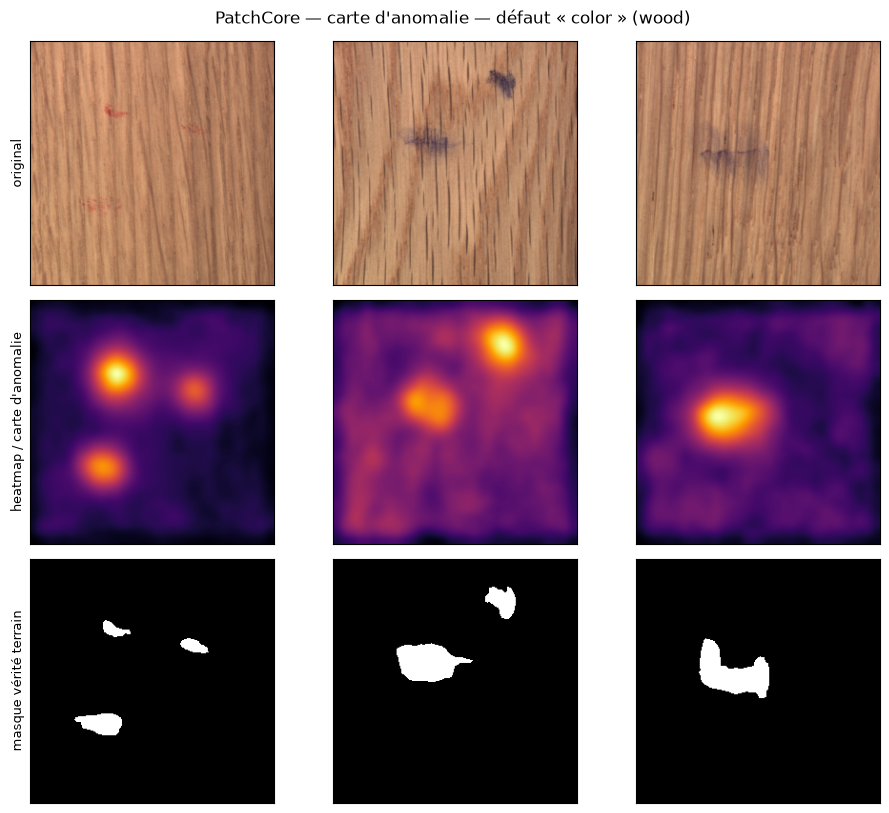

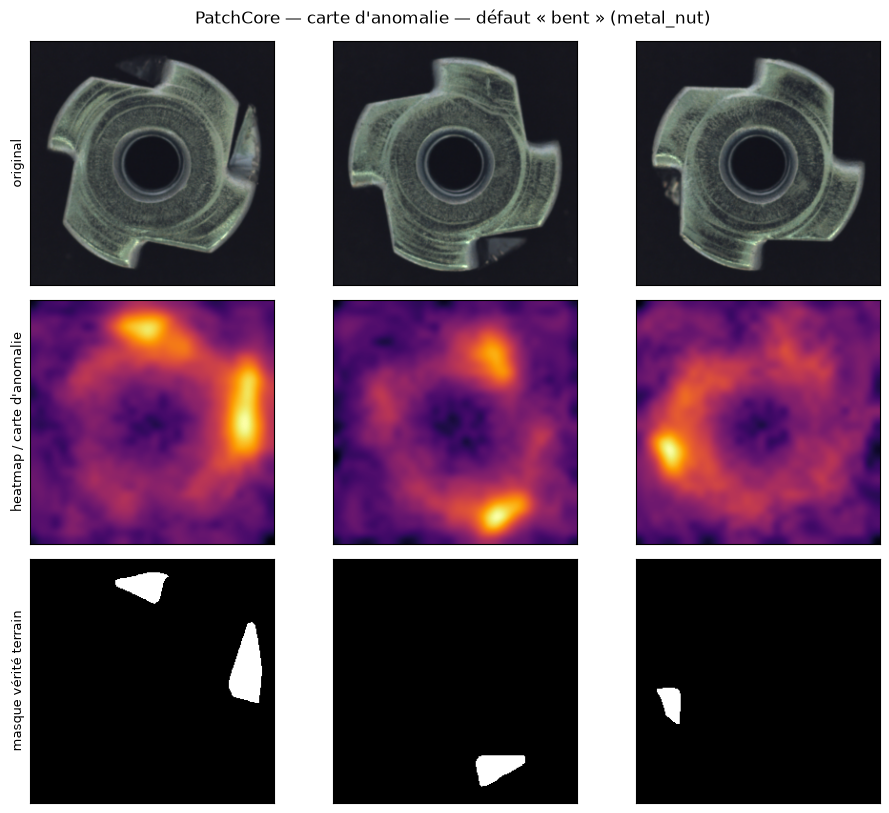

In [18]:
for defect_name, images_group, masks_group, eval_result, label in [
    (defect_categories[0], test_images_by_group, test_masks_by_group, patchcore_wood_eval, 'wood'),
    (metal_defect_categories[0], metal_test_images_by_group, metal_test_masks_by_group, patchcore_metal_eval, 'metal_nut'),
]:
    indices = list(range(min(3, len(images_group[defect_name]))))
    fig = plot_localization_grid(
        images_group, masks_group, eval_result['test_heatmaps_by_group'], defect_name, indices,
        title=f'PatchCore — carte d\'anomalie — défaut « {defect_name} » ({label})',
        reconstructions_by_group=None,
    )
    plt.show()

## Lecture du résultat précédent : PatchCore confirme-t-il l'avertissement de la consigne ?

PatchCore surclasse nettement l'auto-encodeur sur les deux catégories, et de façon spectaculaire sur `metal_nut` :

| Catégorie | Auto-encodeur (AUROC image) | PatchCore (AUROC image) | Auto-encodeur (AUROC pixel) | PatchCore (AUROC pixel) |
|---|---:|---:|---:|---:|
| `wood` (texture) | 0,9158 | **0,9860** | 0,6375 | **0,9304** |
| `metal_nut` (objet) | 0,2556 | **0,9985** | 0,7175 | **0,9866** |

Sur `wood`, le gain est déjà net (+0,07 AUROC image, +0,29 AUROC pixel — la localisation progresse bien plus que la détection globale). Sur `metal_nut`, PatchCore passe d'un échec total de l'auto-encodeur (pire que le hasard) à une détection quasi parfaite (0,9985), avec un rappel de 0,989 (quasiment tous les défauts détectés) pour une précision de 0,979.

**Pourquoi PatchCore résiste au problème identifié ci-dessus** : il ne compare jamais deux images pixel à pixel. Il compare des **patches de features** (extraites d'un réseau pré-entraîné sur ImageNet, donc déjà robuste à une grande variabilité photométrique naturelle — éclairage, reflet, pose) à une mémoire de patches saines, et cherche si un patch de test ressemble à *au moins un* patch déjà vu, où qu'il soit dans la mémoire. Un reflet spéculaire inhabituel mais déjà présent quelque part dans les 210 images saines d'entraînement ne pose donc pas de problème : ce n'est pas une reconstruction globale qui doit être fidèle partout, seulement une correspondance locale par plus proche voisin. C'est précisément ce que l'auto-encodeur ne peut pas faire : sa perte MSE pénalise toute variation par rapport à *sa propre* reconstruction, reflets spéculaires compris.

**Nuance à ne pas perdre** : sur `wood`, PatchCore obtient un rappel de 1,000 mais une précision de 0,882 (quelques fausses alertes) — à l'inverse du profil habituel de l'auto-encodeur dans ce notebook (toujours précision = 1,00, rappel plus faible). Les scores de PatchCore (distances de plus proche voisin) ont une distribution différente de celle des erreurs de reconstruction : un seuil au 99ᵉ centile de la validation ne produit donc pas le même compromis précision/rappel d'une méthode à l'autre — comparer deux méthodes à un seuil identique en position (percentile) ne garantit pas de comparer le même point du compromis précision/rappel.

### Synthèse comparative de toutes les pistes

Six modèles au total : le modèle de référence, les deux variantes d'architecture/perte (goulot
resserré, SSIM), le même auto-encodeur entraîné sur un **objet** plutôt qu'une texture (`metal_nut`), et
**PatchCore** sur les deux catégories. Tableau puis graphique — pour rendre la comparaison lisible d'un
coup d'œil plutôt que de devoir déchiffrer huit décimales par ligne.

| Modèle                                        | Paramètres   | Ratio compression   |   AUROC image |   AUROC pixel |   Rappel@seuil |   Précision@seuil |
|-----------------------------------------------|--------------|---------------------|---------------|---------------|----------------|-------------------|
| Référence (MSE, bc=64, wood)                  | 741379       | 0.75                |        0.9158 |        0.6375 |          0.217 |             1     |
| Goulot resserré (MSE, bc=16, wood)            | 47107        | 3.00                |        0.9202 |        0.6544 |          0.1   |             1     |
| Perte SSIM (bc=64, wood)                      | 741379       | 0.75                |        0.8579 |        0.7651 |          0.2   |             1     |
| Auto-encodeur (MSE, bc=64, metal_nut — objet) | 741379       | 0.75                |        0.2556 |        0.7175 |          0.011 |             0.333 |
| PatchCore (wide_resnet50_2, wood)             | —            |

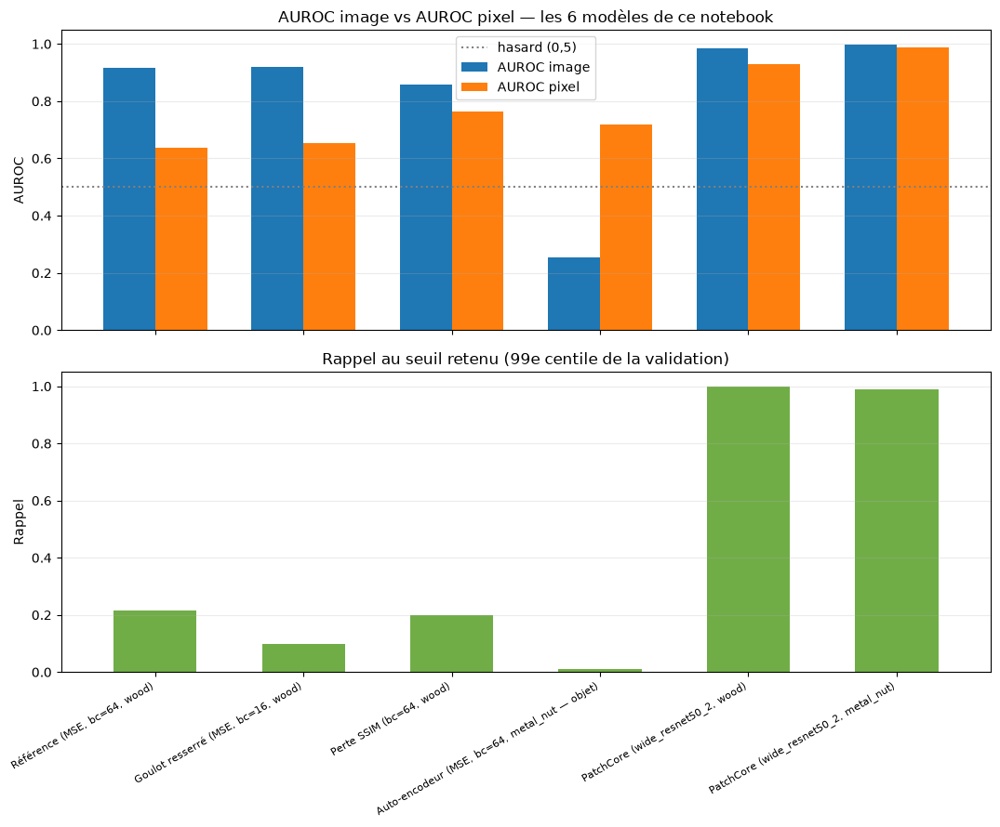

In [19]:
from tabulate import tabulate

comparison_rows = [
    ['Référence (MSE, bc=64, wood)', baseline_parameters, f'{compression_ratio:.2f}',
     baseline_eval['roc_auc'], baseline_eval['pixel_roc_auc'],
     baseline_eval['threshold_metrics'].recall, baseline_eval['threshold_metrics'].precision],
    ['Goulot resserré (MSE, bc=16, wood)', tight_parameters, f'{tight_compression_ratio:.2f}',
     tight_eval['roc_auc'], tight_eval['pixel_roc_auc'],
     tight_eval['threshold_metrics'].recall, tight_eval['threshold_metrics'].precision],
    ['Perte SSIM (bc=64, wood)', ssim_parameters, f'{compression_ratio:.2f}',
     ssim_eval['roc_auc'], ssim_eval['pixel_roc_auc'],
     ssim_eval['threshold_metrics'].recall, ssim_eval['threshold_metrics'].precision],
    ['Auto-encodeur (MSE, bc=64, metal_nut — objet)', metal_parameters, f'{compression_ratio:.2f}',
     metal_eval['roc_auc'], metal_eval['pixel_roc_auc'],
     metal_eval['threshold_metrics'].recall, metal_eval['threshold_metrics'].precision],
    ['PatchCore (wide_resnet50_2, wood)', '—', '—',
     patchcore_wood_eval['roc_auc'], patchcore_wood_eval['pixel_roc_auc'],
     patchcore_wood_eval['threshold_metrics'].recall, patchcore_wood_eval['threshold_metrics'].precision],
    ['PatchCore (wide_resnet50_2, metal_nut)', '—', '—',
     patchcore_metal_eval['roc_auc'], patchcore_metal_eval['pixel_roc_auc'],
     patchcore_metal_eval['threshold_metrics'].recall, patchcore_metal_eval['threshold_metrics'].precision],
]

print(tabulate(
    [[r[0], r[1], r[2], f'{r[3]:.4f}', f'{r[4]:.4f}', f'{r[5]:.3f}', f'{r[6]:.3f}'] for r in comparison_rows],
    headers=['Modèle', 'Paramètres', 'Ratio compression', 'AUROC image', 'AUROC pixel', 'Rappel@seuil', 'Précision@seuil'],
    tablefmt='github',
))

labels = [r[0] for r in comparison_rows]
auroc_image = [r[3] for r in comparison_rows]
auroc_pixel = [r[4] for r in comparison_rows]
recall_at_threshold = [r[5] for r in comparison_rows]

x = np.arange(len(labels))
width = 0.35
fig, axes = plt.subplots(2, 1, figsize=(11, 9), sharex=True)

axes[0].bar(x - width / 2, auroc_image, width, label='AUROC image')
axes[0].bar(x + width / 2, auroc_pixel, width, label='AUROC pixel')
axes[0].axhline(0.5, color='grey', linestyle=':', label='hasard (0,5)')
axes[0].set(title='AUROC image vs AUROC pixel — les 6 modèles de ce notebook', ylabel='AUROC')
axes[0].legend()
axes[0].grid(alpha=0.25, axis='y')

axes[1].bar(x, recall_at_threshold, width * 1.6, color='#70AD47')
axes[1].set(title='Rappel au seuil retenu (99e centile de la validation)', ylabel='Rappel')
axes[1].set_xticks(x)
axes[1].set_xticklabels(labels, rotation=30, ha='right', fontsize=8)
axes[1].grid(alpha=0.25, axis='y')

plt.tight_layout()

with mlflow.start_run(run_name='synthese-comparative'):
    mlflow.log_figure(fig, 'comparaison_6_modeles.png')
plt.show()

## Lecture du résultat précédent : que retenir de l'ensemble de ces pistes ?

Le graphique et le tableau ci-dessus résument l'ensemble des pistes testées dans ce notebook. Trois constats principaux :

**1. L'écart entre l'auto-encodeur et PatchCore domine tous les autres écarts mesurés dans ce notebook.** Les variations internes à l'auto-encodeur (goulot resserré, perte SSIM : AUROC image entre 0,86 et 0,92 sur `wood`) sont modestes comparées au saut vers PatchCore (0,986 sur `wood`, 0,9985 sur `metal_nut`). Aucun réglage de l'auto-encodeur testé ici ne rattrape cet écart — cohérent avec l'avertissement de la consigne dès son introduction : l'auto-encodeur de reconstruction est un baseline pédagogique, pas une méthode état de l'art.

**2. La catégorie (objet vs texture) est le facteur le plus déterminant, mais seulement pour l'auto-encodeur.** L'AUROC image de l'auto-encodeur s'effondre de 0,9158 (`wood`, texture) à **0,2556** (`metal_nut`, objet réfléchissant — pire que le hasard), pour la raison détaillée plus haut (reflets spéculaires). PatchCore, à l'inverse, est **quasiment insensible à ce même changement de catégorie** (0,9860 → 0,9985, dans le même sens qui plus est) : sa robustesse aux variations photométriques, héritée du backbone pré-entraîné, est précisément ce qui manque à l'auto-encodeur.

**3. Le rappel au seuil retenu (99ᵉ centile) ne raconte pas la même histoire que l'AUROC.** Le graphique du bas montre un rappel très inégal (de 0,011 à 1,000) alors que le classement (AUROC) est, lui, presque toujours bon sauf pour l'auto-encodeur sur `metal_nut`. C'est la même leçon que dans `02e-autoencoder-pytorch-gpu-seuils.ipynb`, appliquée maintenant à des méthodes différentes plutôt qu'à des politiques de seuil : classement et décision restent deux questions distinctes, quelle que soit la méthode de score utilisée.

## Synthèse

Ce notebook a conçu, entraîné (PyTorch GPU ROCm, suivi MLflow) et évalué un auto-encodeur convolutif 3 conv / 3 déconv pour la détection d'anomalies sur `wood`, avec les quatre étapes demandées par la consigne : conception (ratio de compression calculé et critiqué), entraînement (courbes train/validation), score et seuil (99ᵉ centile), heatmaps et évaluation quantitative (AUROC image et pixel, matrice de confusion, analyse critique).

La section « Pour aller plus loin » a testé, dans cette même session, les **quatre** pistes citées par la consigne : goulot resserré (légère amélioration, capacité divisée par 15,7), perte SSIM (meilleure localisation pixel, moins bon classement image), comparaison objet (`metal_nut`) vs texture (`wood`) — révélant un **échec catastrophique** de l'auto-encodeur sur l'objet réfléchissant (AUROC image 0,2556, pire que le hasard, à cause des reflets spéculaires confondus avec le signal d'anomalie) — et confrontation à **PatchCore** (bibliothèque `anomalib`, installée pour cette session), qui surclasse l'auto-encodeur sur les deux catégories et **résiste précisément** à l'échec observé sur `metal_nut` (AUROC image 0,9985), grâce à des features pré-entraînées robustes aux variations photométriques et à une comparaison par plus proche voisin plutôt que par reconstruction globale.

**Limite assumée** : une seule catégorie « objet » (`metal_nut`) et un seul backbone/config PatchCore (`wide_resnet50_2`, `layer2`/`layer3`, coreset 10 %) ont été testés ; généraliser ces conclusions à d'autres objets ou d'autres configurations PatchCore resterait à vérifier.